# Employee Segmentation Clustering

### Unsupervised Learning

1. In Machine Learning, clustering is the unsupervised technique of grouping similar instances together. The idea of similarity depends on the task, for example, in some cases two nearby instances can be considered similar (euclidean distance).

## Modelling objectives

1. Identify the groups of target employees, as well as suggest relevant **employee retention** strategies/recommendations to be taken so as to reduce **attrition rates** in the company, thereby improving workforce productivity.
2. Tap on unsupervised clustering machine learning algorithms to achieve `employee segmentation` such that we have clear understanding of the employee segments

#### Problem Statement and background research

> As a HR manager, you want to understand your employees so that appropriate
direction can be given to the management to satisfy and retain the employees

![alt text](https://www.personneltoday.com/wp-content/uploads/sites/8/2017/04/employee-segmentation.jpg "Expanding Window")


### Problem understanding

1. To begin, we need to understand why employees *leave?*
2. According to the Manpower research and statistics department (Singapore), given the impact Covid-19 has on the labour market, there was an observed increase of annual average resignation rates of 1.8% in 2021, from a previous 1.5%, which is almost as high as the recruitment rate. [4] This shows that given the impact covid-19 has on the economy, employees are leaving due to the economic downturn. This is certainly worrying and we will explore the negative consequences of such a phenomenom.

3. There are many reasons for employee turnover, this includes: economic downturn, bad company management, unhealthy working environment, better prospects in another organization in terms of career growth, etc. Employees also may feel that their work is not what they imagined, or perhaps may feel devalued, and unrecognized. [2]


### **Background : Understanding the bane of employee turnover:**
1. Employee turnover is a huge problem for companies. The true cost of replacing an employee can often be quite large. This cost can be also known as turnover costs
1. Cost of turnover refers to expenses both tangible or intangible associated with replacing an employee. Turnover costs include expenses like: unemployment compensation, time and materials for new hire. [7]
3. A report produced by Center for American Progress discovered that for all positions, except for executives and physicians jobs that require very specific skills, the typical median cost of turnover was 21% of an employee’s annual salary. Furthermore, for workers earning less than 50,000 dollars annually which consists of 75% of the workers in the US, case studies show a typical cost of turnover of 20 percent of salary, the same as across positions earning 75,000 dollars a year or less, which includes 9 in 10 U.S. workers. [1]
4. Similarly, according to Organization Science, the estimated cost of turning over one employee earning 8 dollars per hour at a retail chain store is up to 25,000 dollars. [5]

4. A survey (allied workforce) conducted also discovered that about 30% of companies felt that it takes a year or longer for a new employee to reach the level of productivity of a previously departing employee. [3]
4. To summarise, the cost of replacing employees (which is especially higher for experienced ones due to level of seniority) remains largely significant. This can be due to the fact of the amount of time spent to interview and find new replacements, providing sign-on bonuses, and the severe loss of productivity while the new employee gets accustomed to a new job. All these problems can be a hindrance that prevents the company from flourishing in terms of productivity and revenue
5. Therefore, we need to recognize the **importance** of developing a profound understanding towards employees, understanding what motivates, engage and satisfy employees is crucial to accommodate their needs. Hence, brainstorming and implementing relevant retention strategies will ultimately lead to higher employee contentment thereby, more employees staying behind, this will benefit the employee yet simultaneously contributing to a very successful company. 

6. All in all, employees are the 'backbone' of any organization, and employee retention strategies are integral to the success and interests of a company and to avoid the negative impacts of attrition and turnover costs. 

> ##### More specifically, as a HR manager, the aim is to devise employee retention (make employees stay) ideas through analysis, we want to ask ourselves a few questions throughout the process:
1. What could be indicators/reasons of an employee leaving the organisation? We need to explore more on this
2. From an employee's perspective, how can we appear more attractive/appealing towards an employee such as they remain loyal to the organization
3. What can we say about the each employee cluster

##### General imports

In [1]:
# !pip install phik tqdm 

In [2]:
from typing import Sequence, Tuple
from itertools import chain,combinations
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.cm as cm
import seaborn as sns;sns.set()
from scipy.spatial import Voronoi, voronoi_plot_2d
from scipy.spatial.qhull import QhullError
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display, Markdown
from scipy import stats
from scipy.stats import kurtosis,f_oneway,levene
from collections import defaultdict
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Please install for EDA purposes
import phik
from phik import resources, report
from phik.report import plot_correlation_matrix

SKlearn imports

In [4]:
import sklearn
# Data preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler,LabelEncoder,OneHotEncoder
from sklearn.compose import ColumnTransformer
# Pipeline
from sklearn.pipeline import Pipeline,make_pipeline
# Clustering models
from sklearn.cluster import KMeans, AgglomerativeClustering ,DBSCAN, OPTICS,SpectralClustering,estimate_bandwidth,OPTICS,Birch, MeanShift, MiniBatchKMeans, AffinityPropagation
from sklearn.mixture import GaussianMixture
# Metrics/evaluation
from sklearn.metrics import calinski_harabasz_score,davies_bouldin_score, silhouette_score, silhouette_samples
from sklearn.neighbors import DistanceMetric
from sklearn.metrics.pairwise import PAIRWISE_DISTANCE_FUNCTIONS 

# Viz (EDA,etc )
from sklearn.manifold import TSNE,SpectralEmbedding
from sklearn.decomposition import TruncatedSVD,PCA
from scipy.cluster.hierarchy import dendrogram
from sklearn.tree import DecisionTreeClassifier,plot_tree,export_graphviz

rstate = 7
# Setting random state

For visualization, and dimensionality reduction/ and gower (distance) for handling mixed data types of categorical and numerical

In [5]:
from prince import FAMD,MFA,MCA
from gower import gower_matrix
import gower

KPrototypes
> [Source](https://github.com/nicodv/kmodes)

In [6]:
# !pip install kmodes
# Kprototypes under asset folder

In [7]:
try:
    from assets.kmodes.kprototypes import KPrototypes
    from assets.kmodes.kmodes import KModes
except:
    from kmodes.kprototypes import KPrototypes
    from kmodes.kprototypes import KPrototypes
finally:
    from assets.kmodes.kprototypes import KPrototypes
    from assets.kmodes.kmodes import KModes
# Import from folder

<h1> Reading of dataset </h1>

1. This is a dataset collected from HR department in a company, it contains general data of 1470 employees such as gender, work department, etc.
1. Dataset has several categorical variables (in numerical format as well).
2. High number of attributes. (high dimension)
3. To facilitate visualisations and cluster analysis/interpretation, _may_ need to perform dimensionality reduction
4. Attribute names are very long, we will change it later
6. Immediate task: To perform employee segmentation and brainstorm effective yet feasible strategies to retain employees.

In [8]:
comp_df = pd.read_csv('dataset/Company_Employee.csv')
display(comp_df.head(), comp_df.shape)

,Age,Gender,BusinessTravel,Job Function,Distance Between Company and Home (KM),"Education (1 is lowest, 5 is highest)","Job Satisfaction (1 is lowest, 4 is highest)",MaritalStatus,Salary ($),"Performance Rating (1 is lowest, 4 is highest)","Work Life Balance (1 is worst, 4 is best)",Length of Service (Years),Resign Status
0,41,Female,Travel_Rarely,Sales,1,2,4,Single,5993,3,1,6,Yes
1,49,Male,Travel_Frequently,Research & Development,8,1,2,Married,5130,4,3,10,No
2,37,Male,Travel_Rarely,Research & Development,2,2,3,Single,2090,3,3,0,Yes
3,33,Female,Travel_Frequently,Research & Development,3,4,3,Married,2909,3,3,8,No
4,27,Male,Travel_Rarely,Research & Development,2,1,2,Married,3468,3,3,2,No


(1470, 13)

## Exploratory Data Analysis
We will be carrying out data exploration to further understand the characteristics of our employee data before modelling

### General dataset info:
1. Dataset has 1470 rows and 13 columns
2. Very long attribute names, we will make a data dictionary, and rename them to a shorter and convenient form.

In [9]:
display('Shape of dataset',comp_df.shape)
# Show shape

'Shape of dataset'

(1470, 13)

### Data dictionary *
| Attribute | Information | Data type|
| :--- | :--- | :--- |
|`Age`| Age of employee | Numerical-Integer |
| `Gender`| Gender of employee | String (`Male` or `Female`)  |
| `BusinessTravel` | Travel frequency of the employee for business | String (`3` unique values) |
| `Job Function` | Department of the employee | String (`3` unique values) |
| `Distance Between Company and Home (KM)` | Distance Between Company and Home| Numerical-Integer |
| `Education (1 is lowest, 5 is highest)` | Level of education qualification of employee  | Integer- Categorical  |
| `Job Satisfaction (1 is lowest, 4 is highest)	` | Job satisfaction | Integer- Categorical  |
|`MaritalStatus`| Marital Status | String (`3` unique values)  |
|`Salary ($)`| Employee's salary| Numerical|
|`Performance Rating (1 is lowest, 4 is highest)`| Employee's performance rating in the company| Integer- Categorical  |
|`Work Life Balance (1 is worst, 4 is best)`| Work life balance rating| Integer- Categorical  |
|`Length of Service (Years)`| No. of years employee works for the company | Numerical-Integer|
|`Resign Status`| Whether employee is still with the company| String (`Yes` or `No`) |

Rename some columns as they are extremely long

In [10]:
comp_df.rename({'Distance Between Company and Home (KM)': 'Distance (KM)', 'Education (1 is lowest, 5 is highest)': 'Education', 'Job Satisfaction (1 is lowest, 4 is highest)': 'Job_satis', 'Performance Rating (1 is lowest, 4 is highest)': 'Perf_rating', 'Work Life Balance (1 is worst, 4 is best)': 'WorkLifeBalance'},inplace=True,axis=1)

> ### **Descriptive statistics**
1. Dataset shape is (1470,13)
3. Standard deviation for salary is very high, suggesting a large spread where salary vary quite significantly. (drastic jump from 75th percentile to max can be observed as well), suggesting a right skewed distribution, with possible existance of outliers.
2. To cite specific values, the median salary is 4.9k while the max is 20k.

3. Two things to note is that an average employee earns around 6.5k, and median may be a better central tendancy to measure salary in this case
4. Similar mean and median for age may suggest a symmetrical distribution. Pretty high standard deviation observed from age (9), suggests employees of the organization have somewhat differing ages. One thing to note that the youngest employee is only 18 years old, similar to a student. Moreover, the typical employee is of middle age group, given that 50% of the employees are between 30 and 43 years old.
5. More males than females in the organization.
6. Distance between home and company seems to follow a slight right skewed distribution given the sharp jump from 75th percentile to max.
7. Longest serving employee at the company has been serving for around 40 years, which is well above the median of 5, suggesting a possible right skewed distribution
5. Some attributes have very consistent percentiles, this may suggest a categorical variable in numerical format.
5. Attributes are of widely differing magnitudes, we need to perform scaling, even more so since this is a clustering task.
6. Generally, we conclude that there are no erroneous or anomalous values.

In [11]:
display(comp_df.describe(include='all'))
display(comp_df.info())

,Age,Gender,BusinessTravel,Job Function,Distance (KM),Education,Job_satis,MaritalStatus,Salary ($),Perf_rating,WorkLifeBalance,Length of Service (Years),Resign Status
count,1470.000000,1470,1470,1470,1470.000000,1470.000000,1470.000000,1470,1470.000000,1470.000000,1470.000000,1470.000000,1470
unique,NaN,2,3,3,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,2
top,NaN,Male,Travel_Rarely,Research & Development,NaN,NaN,NaN,Married,NaN,NaN,NaN,NaN,No
freq,NaN,882,1043,961,NaN,NaN,NaN,673,NaN,NaN,NaN,NaN,1233
mean,36.923810,NaN,NaN,NaN,9.192517,2.912925,2.728571,NaN,6502.931293,3.153741,2.761224,7.008163,NaN
std,9.135373,NaN,NaN,NaN,8.106864,1.024165,1.102846,NaN,4707.956783,0.360824,0.706476,6.126525,NaN
min,18.000000,NaN,NaN,NaN,1.000000,1.000000,1.000000,NaN,1009.000000,3.000000,1.000000,0.000000,NaN
25%,30.000000,NaN,NaN,NaN,2.000000,2.000000,2.000000,NaN,2911.000000,3.000000,2.000000,3.000000,NaN
50%,36.000000,NaN,NaN,NaN,7.000000,3.000000,3.000000,NaN,4919.000000,3.000000,3.000000,5.000000,NaN
75%,43.000000,NaN,NaN,NaN,14.000000,4.000000,4.000000,NaN,8379.000000,3.000000,3.000000,9.000000,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Age                        1470 non-null   int64 
 1   Gender                     1470 non-null   object
 2   BusinessTravel             1470 non-null   object
 3   Job Function               1470 non-null   object
 4   Distance (KM)              1470 non-null   int64 
 5   Education                  1470 non-null   int64 
 6   Job_satis                  1470 non-null   int64 
 7   MaritalStatus              1470 non-null   object
 8   Salary ($)                 1470 non-null   int64 
 9   Perf_rating                1470 non-null   int64 
 10  WorkLifeBalance            1470 non-null   int64 
 11  Length of Service (Years)  1470 non-null   int64 
 12  Resign Status              1470 non-null   object
dtypes: int64(8), object(5)
memory usage: 149.4+ KB


None

### Missing Values Analysis
1. This is a very clean dataset, with no missing data, which is a good thing.

Age                          0
Gender                       0
BusinessTravel               0
Job Function                 0
Distance (KM)                0
Education                    0
Job_satis                    0
MaritalStatus                0
Salary ($)                   0
Perf_rating                  0
WorkLifeBalance              0
Length of Service (Years)    0
Resign Status                0
dtype: int64

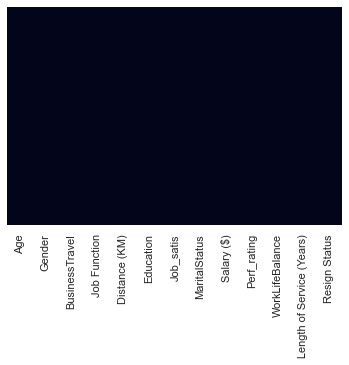

In [12]:
display(comp_df.isna().sum())
sns.heatmap(comp_df.isnull(),yticklabels=False,cbar=False)
plt.show()
# No missing values.

# Further Exploratory Data Analysis

In [13]:
compEDA = comp_df.copy()
# Prevent changes to original dataset

## Exploring data types and unqiue values for some attributes.
1. We are greeted with a plethora of different attributes. For example, we have education which is a categorical variable that is ordinal in nature, and salary which is numerical and continuous in nature.
1. We notice 9 categorical variables, that are both in numerical and string format, as well as 4 numerical-continuous/discrete variables. Between the categorical variables, there are ordinal categorical variables
1. Variables generally represented in correct data types. One thing to note is that there may be some categorical attributes that are in numerical format, for example attributes with ordinal data like Job satisfaction and `Education (1 is lowest, 5 is highest)` may be `categorical` type. I will go through in detail how we should handle these variables with differing data types later on.

3. However, one thing to note is that we may face a few problems given that we have many categorical attributes and fewer numerical-continuous/discrete attributes.
5. We can brainstorm a few methods to tackle this problem, one method is to use clustering techniques such as using K-Prototypes, or even perform _unsupervised feature selection and statistical tests to determine the relevance and significance of the categorical attribute_. This is also done to reduce the ambiguity of clustering.
6. Out of all the methods, I deemed most of it to be suitable, especially determining the significance of the attributes, where we also can try to reduce the feature space.
7. For this study I will use `Label Encoding` for the sole purpose of visualization and not for modelling.
8. Concretely, I will use Label encoding for EDA, so that we can discover distinct clusters, and also group variables with ease.

In [14]:
display(compEDA.dtypes)

Age                           int64
Gender                       object
BusinessTravel               object
Job Function                 object
Distance (KM)                 int64
Education                     int64
Job_satis                     int64
MaritalStatus                object
Salary ($)                    int64
Perf_rating                   int64
WorkLifeBalance               int64
Length of Service (Years)     int64
Resign Status                object
dtype: object

Change into category data type for some categorical attributes in numerical format

In [15]:
compEDA[['Education', 'Job_satis', 'Perf_rating', 'WorkLifeBalance', 'Gender']] = \
compEDA[['Education', 'Job_satis', 'Perf_rating', 'WorkLifeBalance', 'Gender']].astype('category')

In [16]:
for i in compEDA.select_dtypes(exclude='int').columns:
    display(i,compEDA[i].unique())
display(compEDA.info())

'Gender'

['Female', 'Male']
Categories (2, object): ['Female', 'Male']

'BusinessTravel'

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

'Job Function'

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

'Education'

[2, 1, 4, 3, 5]
Categories (5, int64): [1, 2, 3, 4, 5]

'Job_satis'

[4, 2, 3, 1]
Categories (4, int64): [1, 2, 3, 4]

'MaritalStatus'

array(['Single', 'Married', 'Divorced'], dtype=object)

'Perf_rating'

[3, 4]
Categories (2, int64): [3, 4]

'WorkLifeBalance'

[1, 3, 2, 4]
Categories (4, int64): [1, 2, 3, 4]

'Resign Status'

array(['Yes', 'No'], dtype=object)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Age                        1470 non-null   int64   
 1   Gender                     1470 non-null   category
 2   BusinessTravel             1470 non-null   object  
 3   Job Function               1470 non-null   object  
 4   Distance (KM)              1470 non-null   int64   
 5   Education                  1470 non-null   category
 6   Job_satis                  1470 non-null   category
 7   MaritalStatus              1470 non-null   object  
 8   Salary ($)                 1470 non-null   int64   
 9   Perf_rating                1470 non-null   category
 10  WorkLifeBalance            1470 non-null   category
 11  Length of Service (Years)  1470 non-null   int64   
 12  Resign Status              1470 non-null   object  
dtypes: category(5), int64(4), object(

None

## Univariate analysis

### Exploring numerical-continuous variables

# Histograms & boxplots
1. Attributes are of different magnitudes, which we might need to perform feature scaling later on.
2. Age follows a multimodel distribution, but the distribution is not consistent. 50% of the employees are aged between 30 and 44 yrs old. Oldest employee is around 60 years old. Age seems pretty normalized and no noticable outliers.
4. Distance (KM) shows a positively skewed distribution, with no noticable outliers. Median distance in KM from employees house to company is 8KM.
4. Salary and length of service (Yrs) on the other hand follows a right skewed distribution, given its longer right whisker, median may be a better central tendency for both variables. Furthermore, bonuses and prestigious awards should be provided for employees who served the company for over 30 years, for their loyalty and hard work.
1. We can see that Salary & Length of service (Yrs) attributes contain outliers, while remaining numerical variables do not really contain outliers/contain very little.
3. Length of service has smallest interquartile range. Distance KM has the laargest IQR, suggest that the distance from home to company among employees vary significantly
2. Median Salary is around 5000, while max is around 20000, suggests that Salary values varies significantly. Moreover, 50% of employees earn around 2500 to 8000, far away from maximum, which may suggest wages of typical white collar jobs with middle class backgrounds.
3. Most extreme outlier are from employees that earn around $20000 suggesting that they have significant spending power, employees that have been working for the company for over 40 years are also considered extreme outliers
10. Since most variables do not follow a normal distribution, it is likely that we are not able to use any distribution-based clustering algorithm, like gaussian mixtures.
11. StandardScaler may not suitable here as most of the data is non normally distributed , Normalization may be more appropriate

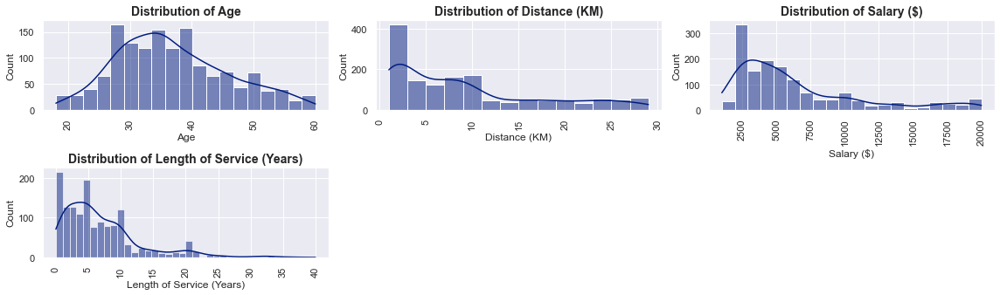

In [17]:
plt.figure(figsize=(16,9))
for o, b in enumerate(['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']):
    sns.set_palette(sns.color_palette("dark"))
    axx = plt.subplot(4,3,o+1)
    sns.histplot(x=b, data = compEDA, ax = axx,kde=True)
    sns.set_style('darkgrid')
    plt.xticks(rotation=90)
    axx.set_title(f"Distribution of {b}",fontweight = 'bold', fontsize = 14)
plt.tight_layout()


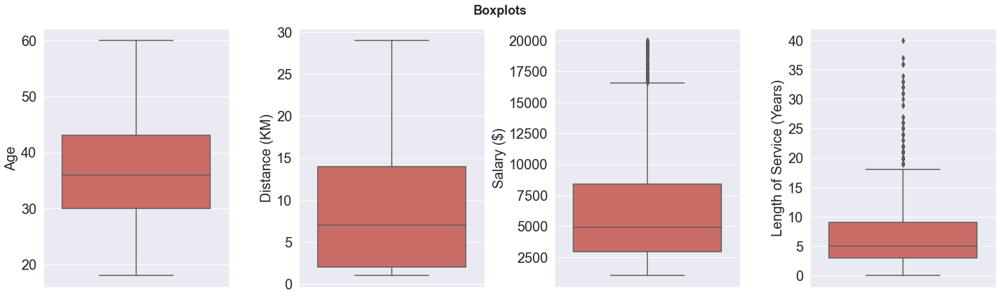

In [18]:
figout, axout = plt.subplots(1, 4, figsize=(20, 6), tight_layout = True)
for i, col in enumerate(['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']):
    axout[i].tick_params(axis='both', which='major', labelsize=20)
    sns.boxplot(data = compEDA, y=col, ax = axout[i],palette='hls')
    figout.suptitle("Boxplots",fontweight = 'bold', fontsize = 18)
    axout[i].set_ylabel(col,fontsize=20)
figout.show()

# Exploring general features

- We can see an uneven count of each class for the variable of resign status, where there are very little people who resign compared to not resigned (around 5:24 ratio). Hence, it may be hard to get a grasp of the cluster of those who resigned compared to those who did not.  Such a scenario could lead to not-so-prominent clusters. Since we want to compare the clusters characteristics, so to further understand the persona and traits of the cluster, we may need to select our clustering algorithms carefully while keeping in mind the mixed data types in the feature space. 
- We also note that there are some dominating classes with a much larger proportion count than other classes for some variables. One example is the `BusinessTravel` variable, where there are close to 1000 employees that travel rarely, as compared to 200 who do not travel, and 250 who travel frequently. This may limit the clustering algorithm to account for information of employees that do not travel or travel frequently
- Hierachical clustering may be good & relevant for this study. Some of such algorithms would be agglomerative clustering. Another approach is to select the linkage parameter for hierachical clustering. Like single link, complete link etc.
> **General Analysis:**
- Most employees have an education level of 3, while there are very few employees with education level of 5 and 1. This may be logical as those with low education level of 1 may not fully have the expertise and skills for the job, hence employees may choose to hire those with higher educational qualifications such as Degree, PHD, etc. Moreover, education level of 5 may suggest employees have specific and specialized skillsets, hence very familiar and proficient in work related to their field. Such employees may be hard to find, which may account for the low count of employees with education level of 5
- There seems to be more male than females in this study.
- A lot more employees that are in research & development department, which may suggest a corporation that aims to develop new services or products, and improving existing ones. 
- Most employees are very satisfied with their job and feel that work life balance is generally good

Moreover, we also want to keep in mind the possible idea of selecting/removing some features to reduce the ambiguity of the clustering.
- We do not need to combine some classes as our variables generally do not have high cardinality.

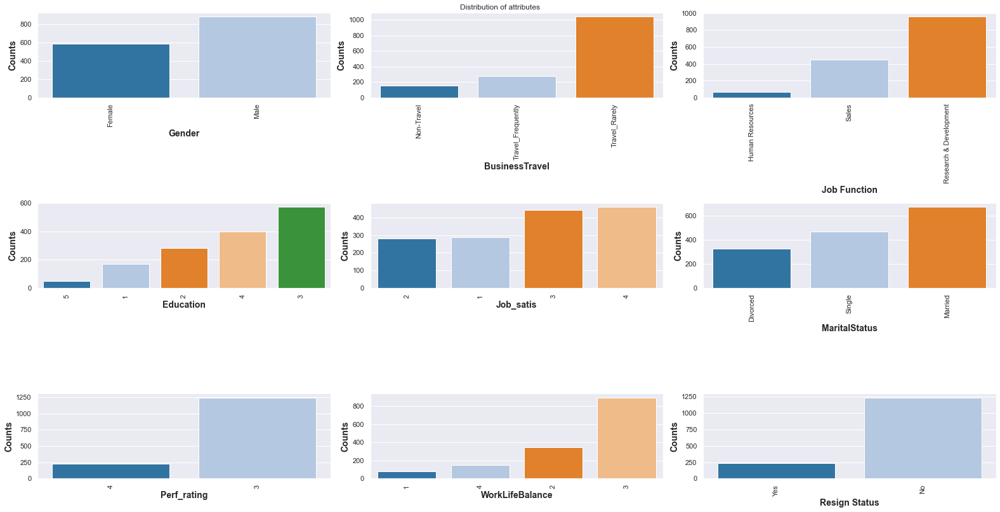

In [19]:
plt.figure(figsize = (22,15))
sns.set_palette(sns.color_palette('tab20'))
for y, f in enumerate(['Gender', 'BusinessTravel', 'Job Function', 'Education', 'Job_satis', 'MaritalStatus', 'Perf_rating', 'WorkLifeBalance', 'Resign Status']):
    axc = plt.subplot(4,3,y+1)
    order2 = compEDA[f].value_counts().sort_values()
    sns.barplot(x=order2.index, y=order2, ax =axc,order=order2.index)
    plt.xlabel(f, fontweight = 'bold', fontsize = 14)
    plt.ylabel(f'Counts', fontweight = 'bold', fontsize = 14)
   
    plt.xticks(rotation=90)
plt.suptitle('Distribution of attributes')
plt.tight_layout()

# Bivariate Analysis

## Scatter matrix of numerical variables
1. No distinctive clusters or patterns observe among the variables as shown by the scatter matrix. Most observations are close to one another and appear at random. There is no pattern in the scatterplot between variables.
2. Triangle liked shape observed between age and length of service. This is logical as length of service should not be larger than age.
3. Employees that have longer length of service tends to have higher salary.
3. There does not appear to be any visible significant relationship among most variables.
4. No extreme bivariate outliers observed among the scatter plots of variables that distorts the trend

In [20]:
fig_scatter = px.scatter_matrix(compEDA,

    dimensions=compEDA[['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']].columns,opacity=0.6,size_max=100,height=700, title='Scatter Matrix of numerical \
variables',
    )
fig_scatter.update_traces(diagonal_visible=False,showupperhalf=True, showlegend=False)
fig_scatter.show()

## Phik (𝜙k) correlation
Phik (𝜙k) is a correlation coefficient that works consistently between numerical, ordinal variables. This is very useful for this current dataset.
- The correlation ranges from 0 to 1, with 0 having no association, while 1 denoting high association
- We note that there is significant correlation between length of service and salary, with a phik correlation of 0.61. This would be logical as longer length of service will mean richer work experiences, with better and posses a variety of industry skillsets. These experienced employees are what employers are generally looking for, and are willing to pay more for the employee to work with them.
- Age is also moderately correlated with length of service having a phik correlation of 0.56. This is likely due to the fact that the longer one works for the organization, the older the person gets. In other words, they are directly proportional
- Most variables are independant of each other, denoted by its low or weak correlation.
- We might be interested in the variable of `Resign Status` as it corresponds directly to our unsupervised clustering task of understanding employees.
- We immediately note that resign status and age has significant correlation of 0.28, and salary with resign status have a correlation of 0.28 though i expected higher, this is likely due to the fact that old age may mean leaving the organization for retirement thus resigning, whereas perhaps a lower salary may result in employee resignation for better career prospects.
- Since there is significant correlation between age and length of service, and between salary and length of service. This explains why there is also significant correlation between age and salary

interval columns not set, guessing: ['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']


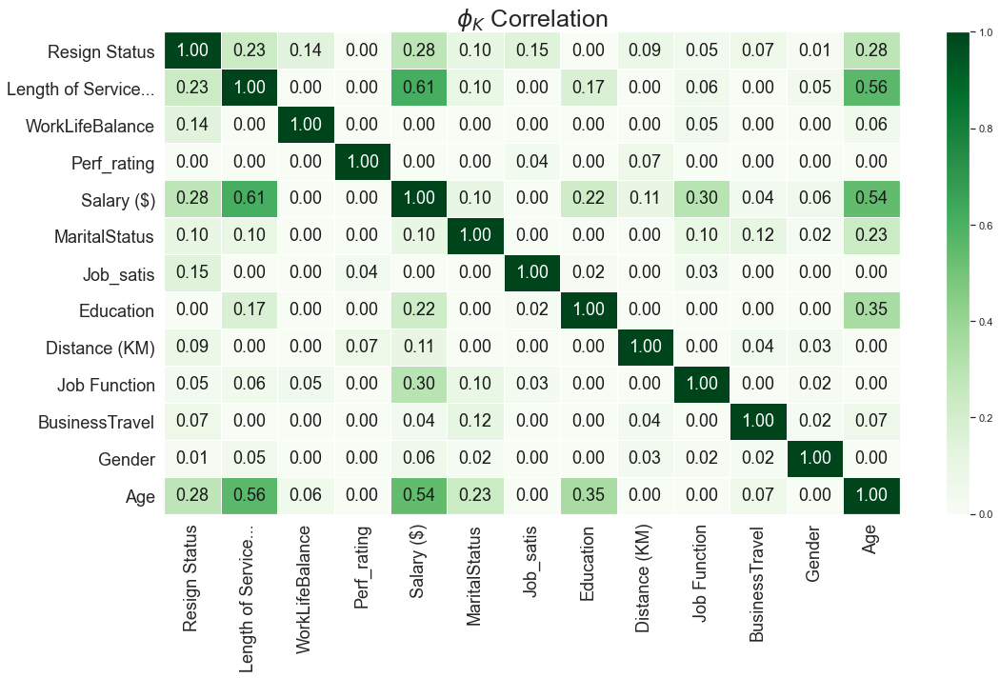

In [21]:
summary = compEDA.phik_matrix()
plot_correlation_matrix(summary.values, 
                        x_labels=summary.columns, 
                        y_labels=summary.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"$\phi_K$ Correlation", 
                        fontsize_factor=1.8, 
                        figsize=(16, 10))
plt.show()


# Violin Plots (Distribution of continous variables accross the categorical variables)

1. Looking at the violin plots, by comparing the distributions groups by age, distance and salary, it appears there is no significant difference between the distributions of males and females for all the numerical variables.
2. Furthermore, variables like job function, there appears to be little significance difference between distributions between the unique groups for all the numerical variables.
3. It is hard for us to make a concrete decision hence, I will be conducting statistical tests like ANOVA to determine if means between groups differ. Ideally, we want to have distinct information in the clusters generated by the algorithms.
>**Shortlisted Features to conduct tests on**
1. I will be conducting statistical tests on a few features namely: gender, Job_satis, WorkLife balance, and perf rating.
2. We will determine if these features have influence on the distribution of the data, and whether it is useful in producing distinct and non overlapping meaningful clusters
3. Since the other variables have different distribution among groups, and also differing medians as indicated by the box plot, we are going to proceed with just the above 4.

Age attribute by categorical columns


---

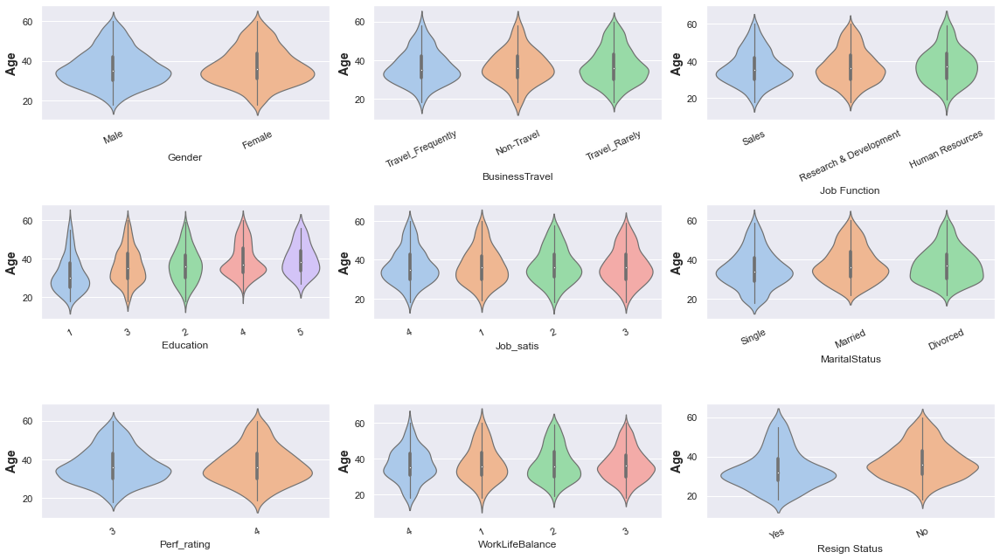

Distance (KM) attribute by categorical columns


---

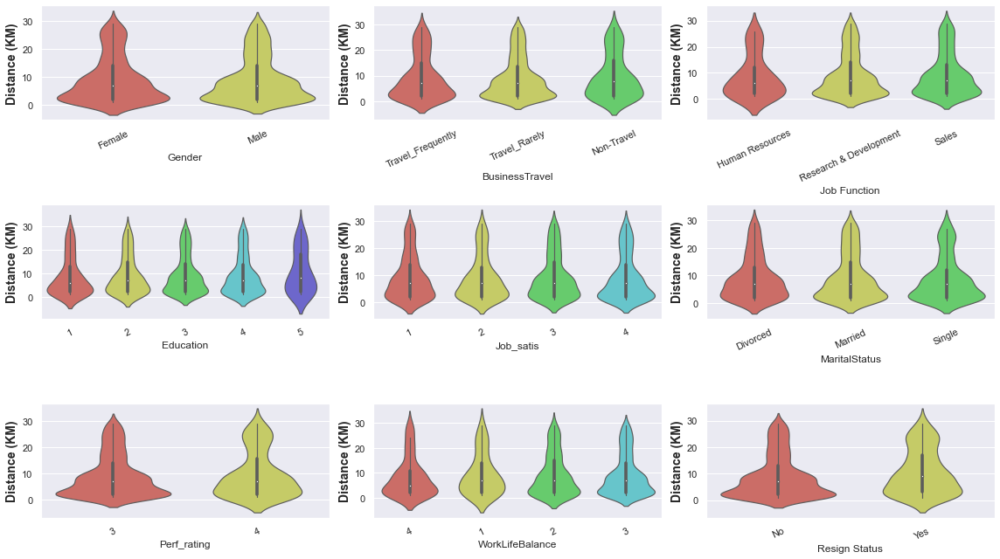

Salary ($) attribute by categorical columns


---

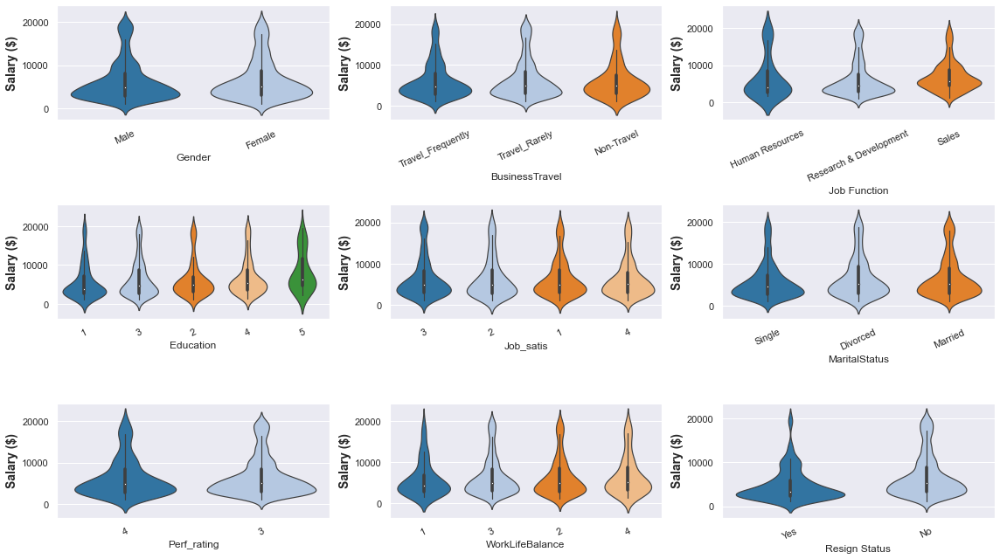

Length of Service (Years) attribute by categorical columns


---

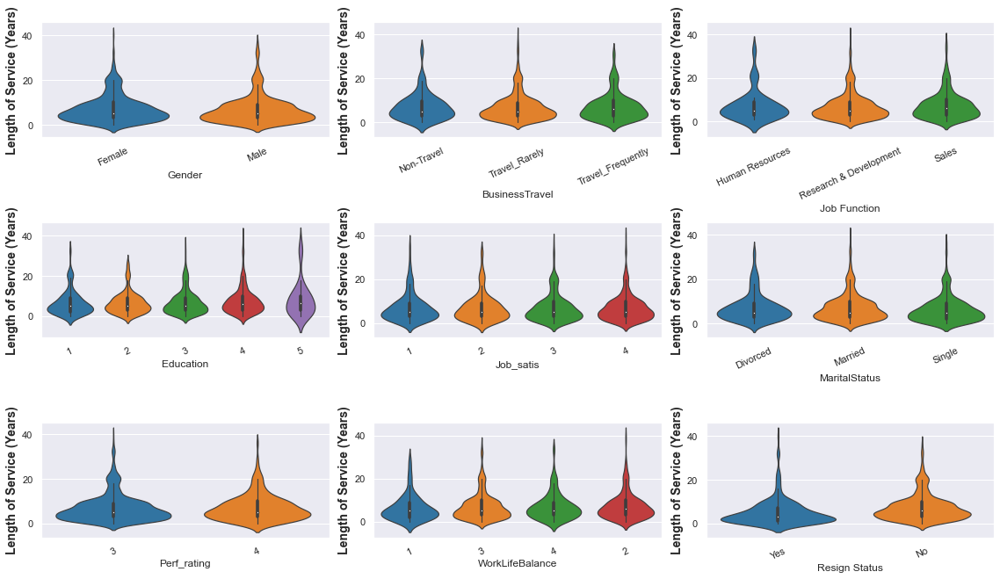

In [22]:
for int_dtype,palette in zip(compEDA.select_dtypes(include='int'), ['pastel', 'hls', 'tab20', 'tab10']):
    plt.figure(figsize=(16,9))
    for o, b in enumerate(compEDA.select_dtypes(exclude='int')):
        sns.set_palette(sns.color_palette(palette))
        axx = plt.subplot(3,3,o+1)
        orderby2 = compEDA.groupby(b)[int_dtype].median().sort_values().index
        sns.violinplot(x=b, y =int_dtype, data = compEDA, ax = axx,order=orderby2,linewidth = 1.2,flierprops = dict(marker = 'o', markersize = 2.5, linestyle = 'none', markerfacecolor = 'red', alpha = 0.75))
        sns.set_style('darkgrid')
        plt.xticks(rotation=25)
        plt.ylabel(int_dtype,fontweight = 'bold', fontsize = 14)
    print(f'{int_dtype} attribute by categorical columns')
    display(Markdown('---'))
    plt.tight_layout()
    plt.show(

        )

# Multivariate analysis
1. We note that there may be some variables that could increase the ambiguity and obscurity of clustering, hence we are skeptical in which variables are necessary for clustering.
2. By grouping the data according to categorical variables, we can see if there is any pattern.
1. Scatter matrix does not give any information that Gender is useful as there is no observed clusters or patterns to indicate whether Gender is useful.
2. Most attributes are also simlar to gender, where after grouping, they do not show any distinct clusters. And even after grouping, there seems to be overlaps of observations for each of the classes, with no clear pattern.
3. Hence we will need to perform more in-depth EDA to determine which features are useful. 

In [23]:
fig_scatter = px.scatter_matrix(compEDA,

    dimensions=compEDA[['Age', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)']].columns,opacity=0.6,size_max=100,height=700, title='Scatter Matrix of numerical \
variables (choose hue below)',
    )
fig_scatter.update_traces(diagonal_visible=False,showupperhalf=True, showlegend=False)
fig_scatter.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction = "left",
            buttons=list([
                                dict(
                    args=[{"marker.color": [compEDA['WorkLifeBalance'].astype('category').cat.codes]}],
                    label="WL Balance",
                    method="update"
                ),
                                dict(
                    args=[{"marker.color": [compEDA['Resign Status'].astype('category').cat.codes]}],
                    label="Resign Status",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['Perf_rating'].astype('category').cat.codes]}],
                    label="Perf_rating",
                    method="update"
                ),
                    dict(
                    args=[{"marker.color": [compEDA['Gender'].astype('category').cat.codes]}],
                    label="Gender",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['BusinessTravel'].astype('category').cat.codes]}],
                    label="BusinessTravel",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['MaritalStatus'].astype('category').cat.codes]}],
                    label="MaritalStatus",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['Job_satis'].astype('category').cat.codes]}],
                    label="Job_satis",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [compEDA['Education'].astype('category').cat.codes]}],
                    label="Education",
                    method="update"
                ),

                dict(
                    args=[{"marker.color": [compEDA['Job Function'].astype('category').cat.codes]}],
                    label="Job Function",
                    method="update"
                )
            ]),
            pad={"r": 5,'t':1},
            showactive=True,
            x=0.01,
            xanchor="left",
            y=1.08,
            yanchor="top"
        ),
    ]
)
fig_scatter.show()

# t-Distributed Stochastic Neighbor Embedding
**t-SNE:**
1. `t-SNE` is an unsupervised technique used primarily for data visualization for data of high dimensionality.
2. It **cannot** be used as a dimensionality reduction technique
3. It is a non-linear method, and its goal is to preserve similarity between the data points.
2. It provides a sense of how our data is represented in high dimensional spaces. Furthermore, we need to pay attention to TSNE visualization if it shows any patterns or distinct clusters
3. The t-SNE algorithm calculates a similarity measure between pairs of instances in the high dimensional space and in the low dimensional space. It then tries to optimize these two similarity measures using a cost function.
4. t-SNE can show clear separations in the data. This can be useful before modelling, to pick the no. of cluster.
5. The output of TSNE cannot be used for clustering as results are not consistent for each run and the result highly dependant on hyperparameters such as perplexity 
5. We need to ensure that the `perplexity` parameter carefully, as selecting too high may not serve the purpose of TSNE anymore.


**Why not use `PCA` for visualization?**
1. We will not use PCA, as it may not work well with categorical data

In [24]:
class MultiColumnLabelEncoder:
    def __init__(self,columns = None):
        self.columns = columns

    def fit(self,X,y=None):
        return self 
    def transform(self,X):
        '''
        Transforms columns of X specified in self.columns using
        LabelEncoder(). If no columns specified, transforms all
        columns in df
        '''
        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def fit_transform(self,X,y=None):
        return self.fit(X,y).transform(X)

In [25]:
tsne = Pipeline([
    ('LE',MultiColumnLabelEncoder(columns = ['BusinessTravel', 'Gender', 'Job Function', 'MaritalStatus', 'Resign Status'])),
    ('Scale', StandardScaler()),
    ('TSNE', TSNE(n_components=2,random_state=rstate,init='pca', n_jobs=-1, perplexity=40))
])
tsne_3d = Pipeline([
    ('LE',MultiColumnLabelEncoder(columns = ['BusinessTravel', 'Gender', 'Job Function', 'MaritalStatus', 'Resign Status'])),
    ('Scale', StandardScaler()),
    ('TSNE', TSNE(n_components=3,random_state=rstate,init='pca', n_jobs=-1, perplexity=40))
])
# 2d viz
tsne_df = pd.DataFrame(tsne.fit_transform(comp_df), columns=['Dimension 1', 'Dimension 2'])
# 3d viz
tsne_df3d = pd.DataFrame(tsne_3d.fit_transform(comp_df), columns=['Dimension 1', 'Dimension 2', 'Dimension 3'])
tsne_df = pd.concat([MultiColumnLabelEncoder(columns=['BusinessTravel', 'Gender', 'Job Function', 'MaritalStatus', 'Resign Status']).fit_transform(comp_df),tsne_df],axis=1)

**TSNE visualization**
- To visualize, I will label encode the categorical variables such as business travel, as TSNE does not accept strings. Furthermore, we will scale the data using standard scaler. **Note that WE ARE NOT LABEL ENCODING FOR THE CLUSTERING ALGORITHM, but for the sole purpose of grouping.**
- There seems to be 4 main clusters. 
- The main cluster on the right seems to comprise with multiple unnoticeable clusters.
- After grouping by resign status, there seems to be 2 main groups. Employees that resign seems to take the top left clusters. 
- However, grouping by other variables does not result in identifiable patterns or cluster.

In [ ]:
text = 'Resign Status'
# marker= dict(color=tsne_df[text])
fig = make_subplots(rows=1, cols=2,specs=[[{'type':'xy'}, {'type':'scene'}]])
scatter_2d = go.Scatter(x=tsne_df['Dimension 1'], y=tsne_df['Dimension 2'], mode='markers',marker= dict(color=tsne_df[text]) )
fig.append_trace(scatter_2d, 1, 1)
fig.update_layout(
    xaxis_title="Dimension 1",
    yaxis_title="Dimension 2",
    legend_title="Traces",
)

scatter_3d = go.Scatter3d(
    x = tsne_df3d['Dimension 1'], y=tsne_df3d['Dimension 2'], z=tsne_df3d['Dimension 3'], mode='markers',marker=dict(
        size=12,
        opacity=0.4,
        color=tsne_df[text]
))

fig.update_layout(
    scene = dict(xaxis_title='Dimension 1',
                    yaxis_title='Dimension 2',
                    zaxis_title='Dimension 3' ),
    title="TSNE Scatter Plot Visualizations (Choose 'hue' below)",
    font=dict(
        size=12,
        color="RebeccaPurple"
    )
)
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction = "left",
            buttons=list([
                                dict(
                    args=[{"marker.color": [tsne_df['WorkLifeBalance'].to_numpy()]}],
                    label="WL Balance",
                    method="update"
                ),
                                dict(
                    args=[{"marker.color": [tsne_df['Resign Status'].to_numpy()]}],
                    label="Resign Status",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Perf_rating'].to_numpy()]}],
                    label="Perf_rating",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['MaritalStatus'].to_numpy()]}],
                    label="MaritalStatus",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Job_satis'].to_numpy()]}],
                    label="Job_satis",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Education'].to_numpy()]}],
                    label="Education",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Gender'].to_numpy()]}],
                    label="Gender",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['BusinessTravel'].to_numpy()]}],
                    label="BizTravel",
                    method="update"
                ),
                dict(
                    args=[{"marker.color": [tsne_df['Job Function'].to_numpy()]}],
                    label="Job Function",
                    method="update"
                )
            ]),
            pad={"r": 5,'t':1},
            showactive=True,
            x=0.01,
            xanchor="left",
            y=1.15,
            yanchor="top"
        ),
    ]
)

fig.append_trace(scatter_3d,1,2)
fig.show()

# Feature engineering (statistical tests)

# ANOVA (Analysis of variance) & Levene tests
1. From the EDA, we clearly noticed that not all variables are relevant in providing distinguishable clusters. Some variables also may increase the ambiguity of clusters. I will then be conducting the ANOVA test to perform feature selection to reduce the ambiguity of clusters
1. We will be using the Levene tests to check for equality of variances for k samples. This is crucial as assumptions ANOVA assumes homogeneity of variance, which means that the variance among the groups should be approximately equal. The levene test can verify that assumption. Levene test will be conducted on significance level of 0.05  
> Null Hypothesis: Variances are equal; Alternate Hypothesis: Variances are not equal
$$H_0 = \sigma_{1}^{2} = \sigma_{2}^{2} = \ldots = \sigma_{k}^{2}$$
$$H_1 = \sigma_{i}^{2} \ne \sigma_{j}^{2} \\ \text{for at least one pair (i,j).}$$


2. ANOVA uses the f-tests to statistically test the equality of means. We are conducting a statistical test to determine if there is a statistically significant difference between 2 or more groups, by testing for differences of means. Assumptions include homogeneity of variances, and each group sample is drawn from a normally distributed population. We are already using levene test to verify the first assumption. For the other assumption, one-way ANOVA is considered a robust test against the normality assumption. This means that it tolerates violations to its normality assumption rather well so we do not have to worry. [Source](https://statistics.laerd.com/statistical-guides/one-way-anova-statistical-guide-3.php)

2. Since there are some attributes with more than 2 unique categories/groups, the ANOVA test would be more relevant than the independant t test.

1. We want to determine if there is a significant difference between the demographics and habits such as salary/distance etc of the different groups for some categorical attributes. This may help us decide on a course of action for what to do with the feature. ANOVA helps us with that.

3. There also might be a possibility that the data have redundant information which means that there might be overlapping information after clustering the data, hence producing meaningless clusters. To prevent that, we have to do feature selection using ANOVA
2. If there is equal population means between groups, it means the feature has no significant difference among its groups suggesting that the attribute do not have a huge influence on the distribution of data and hence it (the categorical variable) should be seriously considered for model training.
3. Ideally, with anova, we want to have features that have an influence on the distribution of data (that is population mean of at least one group is different from the rest)

2. Based on the EDA earlier, (violin plots), we want to select some categorical attributes where the groups have very similar distribution or demographics, where the attribute may not provide useful information to the clustering algorithm.

1. The one-way ANOVA tests the null hypothesis that two or more groups have the same population mean. The test is applied to samples from two or more groups, possibly with differing sizes.
2. We will be using significance level of 0.05. If P-value < 0.05, this means that there would be evidence to reject the null hypothesis.
> One way ANOVA: 

$$\text{$H_0$: $\mu _1 = \mu _2 = \mu _3$.... $= \mu _k$ (All Population mean are equal) }$$
$$\text{$H_1$: At least 2 population mean are different (Means are not all equal)}$$
where µ = group mean and k = number of groups

In [27]:
gender_df = compEDA.pivot(values=['Salary ($)', 'Distance (KM)', 'Age', 'Length of Service (Years)'], columns=['Gender'])
perf_df = compEDA.pivot(values=['Salary ($)', 'Distance (KM)', 'Age', 'Length of Service (Years)'], columns=['Perf_rating'])
wlb_df=compEDA.pivot(values=['Salary ($)', 'Distance (KM)', 'Age', 'Length of Service (Years)'], columns=['WorkLifeBalance'])
job_df = compEDA.pivot(values=['Salary ($)', 'Distance (KM)', 'Age', 'Length of Service (Years)'], columns=['Job_satis'])


- Since we want there to be distinct information in the clusters, we want to find population means that do not differ, where attributes do not have a huge influence on the distribution of data. This is so that we can handle these features later on.
- We also have doubts whether features like `Gender`, `Perf_rating`, `WorkLifeBalance`, `Job_satis` are necessary based on EDA, and whether it provides useful information towards the clustering algorithm.
- Some attributes also do not make logical sense as an input to the algorithm. For instance, if we were to feed `Gender` attribute to the algorithm, there would be certain bias in the algorithm output, which violates fairness of the model (also violates Microsoft AI values). From the perspective of a HR manager, why would the gender matter in brainstorming strategies to satisfy and retain the employees. Hence `Gender` as a feature would be inappropriate.

In [30]:
def organize(sample1,sample2, sample3 = None, sample4 = None):
    if sample3 is not None and sample4 is not None:
        return (sample1.dropna().to_list(),sample2.dropna().to_list(), sample3.dropna().to_list(), sample4.dropna().to_list())
    else:
        # if sample3 is not None:
        #     print(sample3)
        #     return (sample1.dropna().to_list(),sample2.dropna().to_list(), sample3.dropna().to_list())
        # else:
        return (sample1.dropna().to_list(),sample2.dropna().to_list())
def test_conductor(test,test_name = 'Levene'):
    f_oneway_dict = defaultdict()
    names = ['Gender', 'Perf_rating', 'WorkLifeBalance', 'Job satisfaction']
    for col_name,dfs in zip(names,[gender_df,perf_df,wlb_df,job_df]):
        for cols in dfs.columns.levels[0]:
            for idx,dict_cols in enumerate(dfs[cols].columns):
                
                f_oneway_dict[f'sample{idx+1}'] = dfs[cols][dict_cols]
            # display(f_oneway_dict)
            samples =organize(**f_oneway_dict)
            # display(len(samples),samples)
            display(Markdown('#### **{0} Test for {1} ({2}):**'.format(test_name,col_name, cols)))
            t_stat, pval = test(*samples)

            print(f'> {test_name} Test Statistic: {t_stat}; P-Value: {np.round(pval,5)}')
            print('='*70)
test_conductor(levene, 'Levene')

#### **Levene Test for Gender (Salary ($)):**

> Levene Test Statistic: 0.1310668994983261; P-Value: 0.71738


#### **Levene Test for Gender (Distance (KM)):**

> Levene Test Statistic: 0.4611725372293803; P-Value: 0.49718


#### **Levene Test for Gender (Age):**

> Levene Test Statistic: 0.44804362365389266; P-Value: 0.50337


#### **Levene Test for Gender (Length of Service (Years)):**

> Levene Test Statistic: 0.11160327250796881; P-Value: 0.73837


#### **Levene Test for Perf_rating (Salary ($)):**

> Levene Test Statistic: 0.011650944049096857; P-Value: 0.91406


#### **Levene Test for Perf_rating (Distance (KM)):**

> Levene Test Statistic: 1.9048962416347934; P-Value: 0.16774


#### **Levene Test for Perf_rating (Age):**

> Levene Test Statistic: 0.16746688875703702; P-Value: 0.68243


#### **Levene Test for Perf_rating (Length of Service (Years)):**

> Levene Test Statistic: 0.07623385957658844; P-Value: 0.78251


#### **Levene Test for WorkLifeBalance (Salary ($)):**

> Levene Test Statistic: 0.3824216911899887; P-Value: 0.76569


#### **Levene Test for WorkLifeBalance (Distance (KM)):**

> Levene Test Statistic: 0.4466432078452627; P-Value: 0.71971


#### **Levene Test for WorkLifeBalance (Age):**

> Levene Test Statistic: 1.251102514497136; P-Value: 0.28978


#### **Levene Test for WorkLifeBalance (Length of Service (Years)):**

> Levene Test Statistic: 0.25669683784245684; P-Value: 0.85659


#### **Levene Test for Job satisfaction (Salary ($)):**

> Levene Test Statistic: 0.2954627286882086; P-Value: 0.8287


#### **Levene Test for Job satisfaction (Distance (KM)):**

> Levene Test Statistic: 0.18294353690827334; P-Value: 0.90802


#### **Levene Test for Job satisfaction (Age):**

> Levene Test Statistic: 0.17521339523618823; P-Value: 0.9132


#### **Levene Test for Job satisfaction (Length of Service (Years)):**

> Levene Test Statistic: 0.18243989948579986; P-Value: 0.90836


- From the levene tests, All of the p value ['Length of service', 'Age', 'Distance', 'Salary'] are above 0.05, this suggests that there is insufficient evidence to reject null hypothesis, and we can conclude that there is equal variance for ['Length of service', 'Age', 'Distance', 'Salary'] between the groups for the categorical attributes. Hence, the ANOVA assumption of homogeneity of variance between groups are fulfilled, we can conduct ANOVA.

## ANOVA Results
1. From the ANOVA test results, all of the p value are well above the significance level of 0.05. Hence, we have insufficient evidence to reject null hypothesis of equal population means. Hence, we can conclude that the population means for the variables across the groups(for all numerical variables) are the same and do not differ.
2. We can conclude that these features do not have significant influence on the distribution of the data. These features are likely increase the ambiguity of clusters formed, and possibly overlapping/undistinct information in the clusters. 
2. These features will not be useful for clustering as different Job statisfaction level, performance ratings, Gender and Work life balance levels, all have similar age, distance to company , salary and length of service on average which might make the clusters more ambiguous.
3. Hence, we will drop these features later as they do not provide information that could be useful for employee segmentation
3. Further removal of variables is not ideal has it could lead to less meaningful clusters and information loss about the clusters.

> **Summary** for p values

Variable |Gender | Perf_rating| WorkLifeBalance | JobSatisfaction 
:-------------------|:---------------|:---------------|:---------------|:---------------
Salary| 0.22 | 0.51 | 0.6  | 0.99
Distance KM| 0.94| 0.29 | 0.5  | 0.9
Age| 0.16| 0.94|  0.87 | 0.99
Length of service| 0.25 | 0.89| 0.9 | 0.99

In [31]:
test_conductor(f_oneway,'ANOVA')

#### **ANOVA Test for Gender (Salary ($)):**

> ANOVA Test Statistic: 1.4914802153292723; P-Value: 0.22218


#### **ANOVA Test for Gender (Distance (KM)):**

> ANOVA Test Statistic: 0.005027115460965295; P-Value: 0.94349


#### **ANOVA Test for Gender (Age):**

> ANOVA Test Statistic: 1.938048713026884; P-Value: 0.16409


#### **ANOVA Test for Gender (Length of Service (Years)):**

> ANOVA Test Statistic: 1.300167734832264; P-Value: 0.25437


#### **ANOVA Test for Perf_rating (Salary ($)):**

> ANOVA Test Statistic: 0.4303956762361691; P-Value: 0.5119


#### **ANOVA Test for Perf_rating (Distance (KM)):**

> ANOVA Test Statistic: 1.079672801560796; P-Value: 0.29894


#### **ANOVA Test for Perf_rating (Age):**

> ANOVA Test Statistic: 0.005321252293872576; P-Value: 0.94186


#### **ANOVA Test for Perf_rating (Length of Service (Years)):**

> ANOVA Test Statistic: 0.0173227386325178; P-Value: 0.89531


#### **ANOVA Test for WorkLifeBalance (Salary ($)):**

> ANOVA Test Statistic: 0.6123542986718447; P-Value: 0.60702


#### **ANOVA Test for WorkLifeBalance (Distance (KM)):**

> ANOVA Test Statistic: 0.7392739389634323; P-Value: 0.52863


#### **ANOVA Test for WorkLifeBalance (Age):**

> ANOVA Test Statistic: 0.23504533575423875; P-Value: 0.87198


#### **ANOVA Test for WorkLifeBalance (Length of Service (Years)):**

> ANOVA Test Statistic: 0.33527707903214077; P-Value: 0.79984


#### **ANOVA Test for Job satisfaction (Salary ($)):**

> ANOVA Test Statistic: 0.027038829545482108; P-Value: 0.994


#### **ANOVA Test for Job satisfaction (Distance (KM)):**

> ANOVA Test Statistic: 0.18657749054436545; P-Value: 0.90557


#### **ANOVA Test for Job satisfaction (Age):**

> ANOVA Test Statistic: 0.051798411447326435; P-Value: 0.98444


#### **ANOVA Test for Job satisfaction (Length of Service (Years)):**

> ANOVA Test Statistic: 0.033557520533201386; P-Value: 0.99175


# Data Preprocessing

1. In a general machine learning supervised learning task, we would have to either ordinal encode ordinal features or one hot encode nominal features. However, we cannot do the same thing for this study. I will explain below.
1. I want to highlight the slight problem of having categorical attributes such as `MaritalStatus` for our clustering task. For example, after we label encode the attribute, certain clustering algorithms like K-Means along with euclidean distance may not be very ideal or even make sense, as we cannot measure and fathom the euclidean distance between `Single`, `Divorced` and `Married` marital status. The derived cluster centers may not be logical as well. Furthermore, when we label encode, if marital status of single takes on value of 1, divorced takes 2, and married takes 3, our algorithm may think that single (1) is actually closer or similar to divorced (2) than it is to married (3). This does not make sense.
5. This highlights why Label encoding is illogical and we will not use label encoding convert labels to numeric format for modelling.
6. Next, we note that we have a slightly large feature space and directly one hot encoding where we convert each categorical value into a new categorical column and assign a binary value of 1 or 0 to those columns, may not be a good idea, as one hot encoding produces sparse matrix, which can be a problem for some algorithms that are sensitive to data sparsity. 
6. And we need to note that the dimension of the input space increases with the cardinality of our encoded variable, all of such problems brings about the issue of the curse of dimensionality. In such problems, euclidean distance might not work very well (many 1 and 0), since it would have difficulty in measuring all the small distances in a very large space that only gets larger. This is because euclidean distance approach has difficulties working with the data sparsity. (Euclidean distance become insignificant due to **Curse Of Dimensionality**)
7. Hence, to summarize such transformations can lead the clustering algorithms to misunderstand these features and create meaningless clusters, distance based clustering techniques may also not work very well under high dimensionality spaces. 

>- Hence, one hot encoding and label encoding is out of the question, and to deal with this, we need to brainstorm further, since one of the most commonly used distance metric: Euclidean distance is not appropriate in this scenario. I will be exploring different methods to tackle this issue during modelling
> - Hence our data preprocessing steps would only consist of scaling and dropping of some features.
> - From EDA just now, we note that some attributes have uneven classes, we can counter this by using hierarchical clustering.

### So what to do?

> **Datatypes of attributes**
- As seen from EDA, we have several different types of attributes for us to handle.

| Datatype | What to do? | Attribute names|
|---|---|---|
| Numerical | Feature Scaling  | `Distance (KM)`, `Length Of Service (Yrs)`, `Salary ($)`, `Age` |
| Categorical-Ordinal | Feature Scaling but I will explain later on | `Education`, `Job_satis`, `Perf_rating`, `WorkLifeBalance`  |
| Categorical-Nominal | For now, I will be leaving categorical variables as it is, and I will explain how we should handle it later. | `BusinessTravel`, `Job Function`, `MaritalStatus`, `Resign Status`, `Gender` |



1. We will drop some columns for preprocessing, the ones that are deemed to be less important in reducing the ambiguity for clustering as proved by the tests earlier, and drop features that do not have significant influence on the distribution of the data. (at least population mean of at least one group is different). We note that from the statistical test earlier, 'Job_satis', 'WorkLifeBalance', 'Gender', 'Perf_rating' that are deemed to be redundant and less relevant, which will result in the possible existance of overlapping information in clusters. This highlights why we need to drop these columns


2. Next, we will discuss scaling methods, but before that we need to recognize the importance of feature scaling. That is: numerical features in the final dataset that is used for clustering must be on the same scale for each numerical feature to be treated equally by the distance metrics when measuring similarities. Such will allow no statistical bias between attributes within the clustering algorithm. Hence, we need to perform normalization.
> **Why Normalization?**
3. There are some algorithms such as K-Prototypes that require a different type of scaling namely normalization using `MinMaxScaler()`, min max scaler is able to bring the numerical features within range of [0,1]. 
$$X_{Normalize} = \frac {X_i - X_{min}} {X_{max} - X_{min}}$$
4. I will perform scaling individually later for each algorithm in a function.

In [30]:
dropped_cat_cols = [ 'Job_satis', 'WorkLifeBalance', 'Gender', 'Perf_rating' ]

In [31]:
comp_df.drop(columns=dropped_cat_cols,inplace=True)

#### Feature Engineering (Normalization Visualization)
1. We will see how MinMaxScaler transforms our data.
2. Before scaling, magnitudes of certain variables are too small compared to salary.
2. After scaling, we note variables follow similar magnitudes and scale, which is a good thing. Variables are of range [0,1]
3. Original distribution is preserved, similar to what we saw during EDA

In [32]:
def custom_scaling(df, int_cols, scale=MinMaxScaler) -> Tuple[pd.DataFrame]:
    """
    Returns a dataframe with numerical features scaled.
    """
    X = df.copy()
    for c in int_cols:
        # perform scaling on numerical cols
        pt = scale()
        X[c] =  pt.fit_transform(np.array(X[c]).reshape(-1, 1))
    return X

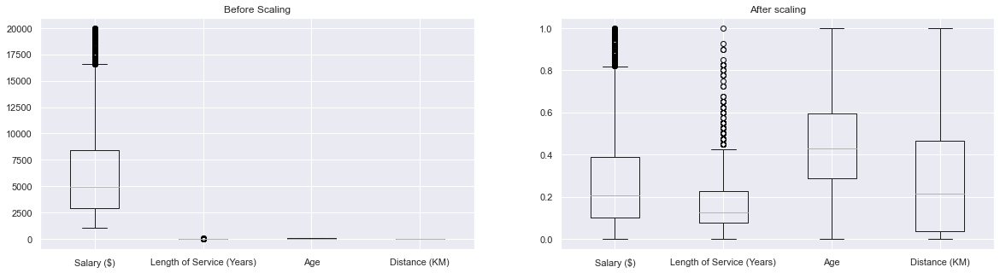

In [33]:
scale_copy=comp_df.copy()
num_cols = ['Salary ($)', 'Length of Service (Years)', 'Age', 'Distance (KM)'] #denote continuous cols
scale_copy = custom_scaling(scale_copy, scale=MinMaxScaler, int_cols=num_cols)

fig, axes = plt.subplots(ncols=2, figsize=(20, 5), sharey=False)
comp_df[num_cols].boxplot(ax=axes[0])
scale_copy[num_cols].boxplot(ax=axes[1])

axes[0].set_title('Before Scaling')
axes[1].set_title('After scaling')
plt.show()

# Modelling

## How do we determine how good our clustering technique is (metrics)?
- Firstly, we want to have an algorithm that can provide us with somewhat distinguishable and explicable clusters.
- To select the best model, we will need a way to evaluate the models performance. However, clustering is an unsupervised task, so we do not have the target variable. We can use silhouette scores,etc. We could consider common clustering metrics like Davies-Bouldin Index which is defined as average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. However, Davies Bouldin score may not be very relevant as our data has nominal variables, and hence the metric would not be used. The usage of centroid distance limits the distance metric to Euclidean space.
- Furthermore, we want data points in the cluster to be similar to each other, and dissimilar from data points assigned to other clusters. Typically, the similarity measure is calculated using euclidean distance for numerical, and Jaccard for categorical. However in this case, we have mixed data types. Hence I will explain a special metric used later.
> #### 1. **Ideas behind Silhouette Coefficient**
- _Cohesion_: Average distance of x to all other vectors in the same cluster. This measures how closely related are
the points in a cluster
- _Separation_: Average distance of x to other vectors in other clusters. Then take minimum among the clusters. This measures how distinct or wellseparated a cluster is from other clusters
> #### **FORMULA:**

$$s = \frac{b-a}{max(a,b)} $$

$$\text{where $a$ = Average distance between each instance within a cluster. (mean intra-cluster distance), } \\

\text{$b$= Average distance between all clusters. (measure the distance of points of different clusters.) }$$ 
---
- The silhouette score has a range of [-1,+1], with 1 being the best.
    - (Near) 1: Means clusters are well apart from each other and clearly distinguished.
    
    - 0: Distance between clusters is not significant.

    - (Near) -1: Means clusters are assigned in the wrong way. It may suggest that the samples has been assigned to the wrong cluster
- Silhouette scores is also a good metric especially for high dimensional data. However, since we have several ordinal categorical variable and numerical variables, a special distance metric is more suitable, we do this by specifying `metric=precomputed` in sklearn's silhouette score. We cannot use the default euclidean. Instead we will use Gower's distance.
> #### 2. **Gower Distance**

![title](https://miro.medium.com/max/440/1*0k6YFgMc-SF8qLlJlzTJHg.png)
1. Specialized hybrid distance for mixed data types
2. Gower’s Distance can be used to measure how different records (dissimilarity) are. The records may be of a combination of categorical, numerical or text data.
3. The distance is always a number between 0 (identical) and 1 (maximally dissimilar).
4. Gower’s distance is computed as the average of partial dissimilarities across individuals
4. The metric for each data type is explained below
    - Quantitative (numerical): range-normalized Manhattan distance
    - Ordinal: variable is first ranked, then manhattan distance is used with a special adjustment for ties
    - Nominal/Qualitative/Categorical variables: variables of k categories are first converted into k binary columns and then the _Dice_ coefficient is used, the distance is 1 if the categories between two records are different and the distance is 0 if the categories are the same. In other words, dice distance is used for measuring similarity.
    
$$DICE = \frac{2|X \cap Y|}{|X|+|Y|} = \frac{2TP}{2TP+FP+FN}$$
5. We will implement gower dissimilarity using gower library to calculate dissimilarirties between employees.
6. Ideally, one way to use gower library is to use the gower_matrix function provided, and where we set the parameter `cat_features` to our categorical variables, we will get a dissimilarity matrix. With this, We can apply techniques such as like hierarchical clustering (e.g. AgglomerativeClustering) on the matrix, where the algorithm computes the dissimilarity between all pairs of clusters, then merge the two clusters that are least dissimilar as measured by the dissimilarity metric. To do this, we can use sklearn's agglomerative clustering, by setting `affinity= 'precomputed'`, and tinkering with the linkage criterions.
7. Similarly, we will use algorithms where fitting distance matrix is approrpriate like gower's distance.

> #### 3. **Calinski-Harabasz index**
- Also known as the Variance Ratio Criterion
- Measures the ratio of the sum of between-clusters dispersion and of inter-cluster dispersion for all clusters, the higher the score , the better the performances
- One drawback is that Calinski-Harabasz index is generally higher for convex clusters than other concepts of clusters, such as density based clusters like those derived through DBSCAN.
> **Note that higher the Calinski Harabasz score indicate better performance suggesting clusters are dense and well separated.**
> [Source](https://medium.com/analytics-vidhya/gowers-distance-899f9c4bd553)

> ### **Feature Engineering** (Limitations of Dice Coefficient and how to handle the limitations)
1. We recall that we have a special scenario of having ordinal categorical data. We need to treat ordinal categorical data as numerical data due to the following reasons:
    - For instance, education attribute is ordinal in nature, an education level of 5 is higher than education level of 1. Moreover, the difference between education level 1 and 2 is different from the difference between education level 1 and 5. We could say that 1 is more different than 3 as compared to 2. This is the problem with ordinal variables, where the difference between unqiue categories is _different_
    - Furthermore, since gower distance uses the dice distance as a metric for calculation of dissimilarity for qualitative records, the distance is 1 if categories between 2 records are different, and 0 if categories are the same. This suggest that dice coefficient would be reliable only for data that cannot be ranked (difference between categories of an attribute are the same).
    - Given this, we need to think of a way to account for the order difference, since dice coefficient is not reliable for ordinal categorical data.
    - We must cannot treat ordinal categorical variables the same as nominal categorical variable. Instead, we must treat them as numerical variables. In this case, the `Education` variable is first ranked, and then manhattan distance is computed, similar with quantitative variables, but with the special adjustment for ties. 
2. We also recall that we left the nominal categorical attributes as it is. This is because algorithms we will be using later such as K prototypes allows us to specify the categorical columns through `categorical` parameter. Furthermore, when calculating the dissimilarity matrix using gower library, we can also easily set the `cat_features` parameter to our categorical attributes.

In [34]:
int_cols = ['Salary ($)', 'Length of Service (Years)', 'Age', 'Distance (KM)', 'Education']
select_cols = list(set(comp_df.columns) - set(dropped_cat_cols) - set(int_cols))
# Select non dropped categorical cols
cat_cols = [comp_df.columns.get_loc(c) for c in select_cols]
# Get location of the selected categorical columns

##### Gower Distance Calculation example
To calculate gower distance for first 2 employees in the dataset. We have to use the range normalized manhattan metric for numerical (quantitative) data type. Next, the dice distance measures if the attribute if the record are similar for categorical variables

Attribute | Dissimilarity
:-------------------|:---------------
Age | absolute(0.54-0.73)/ 1 = 0.19
Business travel | 1
Job Function | 1 
Distance (KM) | absolute(0.00 - 0.25)/1 = 0.25
Education | absolute(0.25-0)/1 = 0.25
Marital Status | 1 
Salary | absolute(0.262 - 0.217) /1 = 0.045
Length of Service (Yrs) | absolute(0.15 - 0.25)/1 = 0.1
Resign Status | 1 
---
Gower Distance: (0.19 + 1+1+0.25+0.25+1+0.045+0.1+1)/9 = 0.537

1. This corresponds to the first entry in the dataset in row 1 column 2 and column 1 row 2. Hence, this measures the dissimilarity between employee 1 and 2

In [35]:
print((0.19 + 1+1+0.25+0.25+1+0.045+0.1+1)/9)

0.5372222222222223


In [36]:
gower_sample = comp_df.copy()
gower_sample[['Education', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)', 'Age']] = MinMaxScaler().fit_transform(gower_sample[['Education', 'Distance (KM)', 'Salary ($)', 'Length of Service (Years)', 'Age']])
display(gower_sample.iloc[:2])
display(pd.DataFrame(gower_matrix(gower_sample, cat_features = [col in select_cols for col in gower_sample.columns ] )))

,Age,BusinessTravel,Job Function,Distance (KM),Education,MaritalStatus,Salary ($),Length of Service (Years),Resign Status
0,0.547619,Travel_Rarely,Sales,0.00,0.25,Single,0.262454,0.15,Yes
1,0.738095,Travel_Frequently,Research & Development,0.25,0.00,Married,0.217009,0.25,No


,0,1,2,3,4,5,6,7,8,9,...,1460,1461,1462,1463,1464,1465,1466,1467,1468,1469
0,0.000000,0.537325,0.165165,0.552701,0.428001,0.381003,0.449999,0.514679,0.485354,0.484714,...,0.432364,0.306616,0.420778,0.434843,0.217711,0.567774,0.412414,0.410925,0.398105,0.422260
1,0.537325,0.000000,0.462232,0.164053,0.225068,0.228070,0.252356,0.375238,0.283790,0.285414,...,0.459589,0.634946,0.380325,0.368199,0.490969,0.150555,0.182278,0.257773,0.194775,0.227264
2,0.165165,0.462232,0.000000,0.430453,0.290073,0.260616,0.318341,0.362126,0.404487,0.389710,...,0.314812,0.447178,0.567424,0.348685,0.307242,0.436015,0.336837,0.324767,0.548277,0.306396
3,0.552701,0.164053,0.430453,0.000000,0.234223,0.176989,0.228515,0.417534,0.272976,0.258462,...,0.345469,0.676777,0.491468,0.307121,0.399011,0.153168,0.266437,0.183202,0.202479,0.181234
4,0.428001,0.225068,0.290073,0.234223,0.000000,0.279457,0.151627,0.213662,0.445102,0.202811,...,0.313098,0.598904,0.330261,0.357553,0.300821,0.259613,0.099674,0.090249,0.366669,0.108916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0.567774,0.150555,0.436015,0.153168,0.259613,0.213490,0.290791,0.281666,0.195985,0.175916,...,0.323241,0.583120,0.358922,0.388860,0.464084,0.000000,0.263256,0.261767,0.284219,0.217206
1466,0.412414,0.182278,0.336837,0.266437,0.099674,0.324898,0.179872,0.265717,0.356160,0.174641,...,0.350068,0.521452,0.230587,0.308787,0.365574,0.263256,0.000000,0.120536,0.352582,0.117743
1467,0.410925,0.257773,0.324767,0.183202,0.090249,0.291928,0.122828,0.288037,0.354853,0.123152,...,0.255987,0.525321,0.351123,0.267305,0.252974,0.261767,0.120536,0.000000,0.301093,0.050116
1468,0.398105,0.194775,0.548277,0.202479,0.366669,0.314115,0.290783,0.564457,0.358856,0.362271,...,0.537698,0.487790,0.349836,0.419456,0.323045,0.284219,0.352582,0.301093,0.000000,0.305372


## Selecting the number of clusters with silhouette analysis
- Silhouette analysis can be used to study the separation distance between the resulting clusters. 
- It helps us determine and assess an optimal value for n_clusters. The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters and thus provides a way to assess parameters like number of clusters visually. Also from the thickness of the silhouette plot the cluster size can be visualized. 
- To facilitate silhouette analysis, we need to reduce the dataset dimensions so that we can plot the silhouette diagram out.
- Hence, we can use several methods such as PCA or FAMD.
> **PCA:**
- Principal component analysis is an unsupervised clustering method which maps the original data space into a lower dimensional space.
- PCA finds a subspace that most preserves the data variance, with the subspace defined by the dominant eigenvectors of the data’s covariance matrix. PCA helps us derive components that explains most of the variability of the dataset. That is preserving maximum variability. The new components can be considered as linear combinations of the original values. It is always recommended to perform PCA on dataset with continuous variables only. _However, our dataset has a mixed of categorical and numerical, hence PCA is not relevant here. What about FAMD?_
> **FAMD:**
- FAMD is useful tool for dimensionality reduction for analysing data with continuous and categorical features.
- Since it is not recommended to one hot encode or label encode categorical data, we will use FAMD to aid us in investigating the results of clustering. It helps us visualize the clusters formed in lower dimensions
- Factor analysis of mixed data does the analysis with a combination of PCA and MCA techniques. MCA stands for multiple correspondence analysis, which is suitable for categorical data. We can use FAMD technique for dimension reduction.
- The categorical variables are transformed into a disjunctive data table and then scaled using the specific scaling of MCA. This ensures to balance the influence of both continous and categorical variables in the analysis. It means that both variables are on a equal foot to determine the dimensions of variability. [Source](https://www.rdocumentation.org/packages/FactoMineR/versions/2.4/topics/FAMD)
- Note that we need to scaling numerical variables before using FAMD. This is critical for valid results. However, prince library already performs scaling for us as seen from documentation.

#### We will be applying the clustering technique on the raw data then using Factor Analysis of Mixed Data via the `prince` library to visualize the clusters. Note that we are not clustering on the output of FAMD.

> **How do we evaluate our clustering techniques?**
1. We will also use gower distance to determine the quality of clusters formed by the algorithm. Specifically, we will use `gower_matrix` function to convert the original dataframe into a gower matrix, then specify `silhouette_score(gower_matrix,metric='precomputed')`. We pass a gower distance matrix inside sklearn silhouette scores function. We also need to specify `metric='precomputed'` as we are passing the distance array itself. Hence, this will compute the silhouette score.
2. Since `gower_matrix` from the gower library already helps us scale our numerical variables, we will not need to perform scaling
3. We will also plot a silhouette diagram to perform silhouette analysis. From the visualization produced by FAMD, we can scrutinize the separation distance between the resulting clusters. On the other hand, the silhouette plot shows how close each point in a cluster is to points in other clusters. 
4. It will allow us to assess the quality of clusters formed so we can take appropriate action to perform further improvement for the clusters of low quality and explicability. I will suggest further improvement steps in the model improvement stage. Next, I will also be using a series of metrics as explained earlier, like silhouette coefficient of cluster, calinski harabasz index along with other appropriate metrics to support the analysis. The average silhouette score will be a benchmark for the quality of clusters formed. Note that clusters that are poorly defined would generally have low silhouette score, low calinski harabasz index.



**Visualize clusters from clustering (3d) by plotting scatter plot and silhouette diagram**

In [213]:
def cluster_visualization(X:Sequence,n_clust, model = None, metric='precomputed', model_params=None) -> Tuple[pd.Series]:
    """
    Plots 3d scatter plot and silhouette diagram
    """
    df = X.copy()
    # Create a subplot with 1 row and 2 columns
    fig = make_subplots(rows=1, cols=2,specs=[[{'type':'xy'}, {'type':'scene'}]],subplot_titles=('Silhouette Diagram', '3d Scatter plot visualization with clusters using FAMD'))
    if n_clust is None:
        # For models that do not require us to specify clusters
        if model_params is not None:
            _, cluster_labels, centroids, mod = model(X, **model_params)
        else:
            _, cluster_labels, centroids, mod = model(X)
    else:
        if model_params is not None:
            _, cluster_labels, clusters_no, mod = model(n_clust,df, **model_params)
        # Models that need clusters
        else:
            _, cluster_labels, clusters_no, mod = model(n_clust,df)

# Get cluster labels
    df['Labels'] = cluster_labels

    if metric== 'precomputed':
        input_df = gower_matrix(df,cat_features=[col in select_cols for col in df.columns])

    
    # Calculate silhouette score based on gower matrix.
    silhouette_avg = silhouette_score(input_df, cluster_labels, metric=metric)
    sample_silhouette_values = silhouette_samples(input_df, cluster_labels, metric=metric)
    print('calinski_harabasz_score',calinski_harabasz_score(input_df,cluster_labels))
    print(
        
        "For n_clusters =",
        n_clust,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    try:
        print('Clustering cost: sum distance of all points to respective cluster centroids', mod.cost_)
    except:
        pass
    # Clustering cost, defined as the sum distance of all points to their respective cluster centroids.

    y_lower=10
    if n_clust is None:
        try:
            n_clust = clusters_no
        except:
            pass
    for i in range(n_clust):
        cluster_silhouettes = sample_silhouette_values[cluster_labels == i]
        cluster_silhouettes.sort()
        cluster_size = cluster_silhouettes.shape[0]
        y_upper = y_lower + cluster_size
        colors = sns.color_palette('tab10')
        filled_area = go.Scatter(y=np.arange(y_lower, y_upper),
                                 x=cluster_silhouettes,
                                 mode='lines',
                                 showlegend=False,
                                 line=dict(width=0.5,
                                          color=f'rgb({colors[i-1][0] * 255}, {colors[i-1][1] * 255}, {colors[i-1][2] * 255})' ),
                                 fill='tozerox')
        y_lower = y_upper + 10
        fig.append_trace(filled_area, 1, 1)
        fig['layout']['yaxis1'].update(title='Cluster label',
                                   showticklabels=False,
                                   range=[0, len(X) + (n_clust + 1) * 10])

    # FAMD SECTION
    X_famd = X.copy()
    dim_red = FAMD(random_state=rstate, n_components=3)
    sample = dim_red.fit_transform(X_famd )
    # Rename to facilitate plotting
    try:
        sample.rename({0:'Dimension 1', 1: 'Dimension 2', 2:'Dimension 3'},axis=1,inplace=True)
        sample['Labels'] = df['Labels']
        cluster_centroids = sample.groupby('Labels').mean()
    except:
        pass

    # Scatter plot 3d
    sc = go.Scatter3d(x= sample['Dimension 1'], y= sample['Dimension 2'], z=sample['Dimension 3'],mode='markers',marker=dict(opacity=0.5,color= sample['Labels'] ) )
    fig.append_trace(sc, 1, 2)
    centers = go.Scatter3d(x=cluster_centroids['Dimension 1'], 
                         y=cluster_centroids['Dimension 2'],
                         z=cluster_centroids["Dimension 3"],
                         showlegend=False,
                        mode='markers', marker=dict(symbol='diamond', color='black',size=12,opacity=.7)
                        )
    fig.append_trace(centers,1,2)
    avg_line = go.Scatter(x=[silhouette_avg] * 53000, y=np.arange(50000), showlegend=False, mode='lines', line=dict(color='red', dash='dash', width=1), fill='tozeroy')
    fig.append_trace(avg_line, 1, 1)
    fig.update_layout(
    scene = dict(xaxis_title='Dimension 1',
                    yaxis_title='Dimension 2',
                    zaxis_title='Dimension 3' ),
    title=f"3D Visualizations for {n_clust} clusters with {type(mod).__name__}",
    font=dict(
        size=12,
        color="RebeccaPurple"
    )
)
    fig.show()
    return cluster_labels

#### General functions to get infomation regarding each cluster
- Since we are also concerned with regards to the interpretability of the clusters formed, I will use a series of visualizations, namely the pair plot and bar graph. I will also be including descriptive statistics such as the mode/mean of the attributes in the cluster, so as to better understand the characteristics of the cluster. I will do this for each model later on.
- We will be plotting a pair plot and using pandas `.agg()`

In [38]:
def bar_plot(df):
    fig = plt.figure(figsize = (22,15))
    for cnt,i in enumerate(int_cols):
        axc = plt.subplot(4,3,cnt+1)
        sns.barplot(y=i,x = 'Clusters', data=df, ax=axc, estimator=np.mean)
    return fig

In [374]:
def get_cluster_info(df, lbls, int_cols = int_cols, pair = True, return_df = True):
    eval_df = df.copy(deep=True)
    integer_cols = int_cols.copy()
    eval_df['Clusters'] = lbls
    cluster_info= eval_df.groupby('Clusters').agg(
            {
                'Age':'mean',
                'Resign Status': lambda x: x.value_counts(sort=True).index[0],
                'MaritalStatus': lambda x: x.value_counts(sort=True).index[0],
                'Education': lambda x: x.value_counts(sort=True).index[0],
                'Job Function': lambda x: x.value_counts(sort=True).index[0],
                'Distance (KM)': 'mean',
                'BusinessTravel':lambda x: x.value_counts(sort=True).index[0],
                'Length of Service (Years)': 'mean',
                'Salary ($)': 'mean',
            }
        ).reset_index()
    cluster_info['Cluster Size (% of Total)'] = pd.Series(eval_df['Clusters']).value_counts() / len(eval_df['Clusters']) * 100
    cluster_info.set_index('Clusters', inplace=True)
    display(Markdown('#### **Cluster Info**'))
    display(cluster_info)
    if pair:
        sns.pairplot(eval_df[integer_cols + ['Clusters']], hue='Clusters', corner=True, palette="tab10")
        plt.show()
    return eval_df

# Model Selection

# K-Prototypes
- One of the conventional clustering methods commonly used in clustering tasks and efficiently used for large datasets is the K-Means algorithm. However, its method is not very suitable for data that contains categorical variables. This problem happens when the cost function in K-Means is calculated using the Euclidian distance that is only suitable for numerical data. 
- We have a special scenario where our data contains categorical variables and numerical variables.

- This is where K-Prototypes come into play, where the algorithm is able to handle mixed data types. K-Prototype is a clustering method based on partitioning. Its algorithm is an improvement of the K-Means and K-Mode clustering algorithm.
- The K-prototypes algorithm requires us to specify the categirical attributes.

- Finally, instead of calculating the within the sum of squares errors (WSSE) with euclidian distance, K-Prototype provides clustering cost that combines the calculation for numerical and categorical variables. The cost is defined as the sum distance of all points to their respective cluster centroids.
> **How does K-prototypes work?**
1. We select _k_ prototypes from dataset, one for each cluster, then allocate each instance to a cluster whose prototype is the nearest to it. This allocation is done with considering the dissimilarity measure which is described next. After all instances have been allocated to a cluster, retest the similarity of objects against the current prototypes. If we find that an object is found such that its nearer to another cluster prototype, update the prototypes of both the clusters. We repeat this step until there is no changes in clusters. 
2. It measures distance between numerical features using Euclidean distance (like K-means) but also measure the distance between categorical features using the number of matching categories.

In [137]:
def k_prototypes(n_clusters,X:Sequence, init='Cao', integer_cols = int_cols, select_cols= select_cols):
    df = X.copy()
    # Define categorical and int variables
    # cat_name=select_cols
    cat_cols = [df.columns.get_loc(c) for c in select_cols]

    # Perform minmax scaling
    df = custom_scaling(df, int_cols=integer_cols)
    
    k_pro = KPrototypes(n_clusters=n_clusters,max_iter=1000, random_state=rstate, init=init, n_jobs=-1)
    k_pro.fit(df, categorical=cat_cols)
    lbls = k_pro.predict(df, categorical=cat_cols)
    return None, lbls,k_pro.cluster_centroids_, k_pro

### K-prototypes Clustering results and cluster information

1. Use of default `n_clusters = 8` parameters, and use the default init = `Cao`. The CAO approach selects prototypes for each data object based on the density of the data point and the dissimilarity value.
2. **We also note that we need to scale the numerical variables before fitting the data.**
2. Perform min max scaling (normalization) on numerical features before fitting k prototypes
3. Specify categorical attributes using `categorical` parameter

In [274]:
lbls = cluster_visualization(X=comp_df,n_clust=8, model=k_prototypes)

calinski_harabasz_score 149.64595742092555
For n_clusters = 8 The average silhouette_score is : 0.24541603
Clustering cost: sum distance of all points to respective cluster centroids 371.3533033219934


> **Observations from KPrototypes Clustering**

From the silhouette diagram and scatter plot, we note
- Cluster sizes are not all even, some clusters are too small, which may suggests there are too many clusters. For example, the brown cluster is too small. The light blue cluster seems to be quite well defined
- There are some points that have negative silhouette score, which may suggest that data point is assigned to the wrong cluster. For example, half the data points in the red cluster have negative silhouette score.
- For the red and orange cluster, the silhouette score is below average (does not cross the red average line) with most data points with negative silhouette score. This indicates that the cluster are poorly defined, of low quality.
- The purple cluster as seen from the scatter plot seems pretty well defined, where the other clusters tend to 'mix' in the middle, being quite close to each other. Generally, there is some separation among clusters

- In general, clusters seem to be quite close to each other and possibly overlapping which suggest that clusters are not very well defined, this is likely due to the large dataset size, and too having too many clusters

- Clustering Cost (370), which Sum distance of all points to respective cluster centroids is moderately low which is good. Silhouette score is 0.24, where the distances between cluster may not be very large.
- We will need to opt for model improvement later on to find suitable number of clusters


### **K-Prototypes Cluster Analysis**
1. Looking at the descriptive statistics that tells us the mean for continuous attributes such as salary,etc and mode for categorical attributes of each cluster, we immediately notice that there is no cluster that shows the characteristics of employees that resign. Hence, since we do not know the characteristics of employees that resign, it is quite hard for us to devise any strategies to retain and satisfy employees. 
2. With 8 clusters generated from K prototypes, we are able to understand the characteristics and disparity between employees that earn significantly more (over 15k) and those who earn less (around 4k to 5k). Generally, employees that have a longer length of service are older (in cluster 2) and earn more than those who have a lesser length of service. (Direct relationship). This is logical as longer service to organization would mean higher seniority in the company, specifically, this mean that employees in cluster group 2 would have more experience with a more senior role in the company, hence generally earning more.

3. Overall, 8 clusters with K Prototypes though it provides somewhat variation of characteristics, it still does not provide us with enough information for us to fulfill our objectives, as we cannot understand the characteristics of those that resigned. We are also unable to determine the employee group that is most vulnerable to resignation.
> **Pair Plot**
1. Looking at the pair plot, we note some ambiguous non circular clusters forming, which suggest K prototypes is a good algorithm, however, we still need to further improve on it.
> **Bar Plot**
1. Cluster 2 seems to describe employees that are slightly older in age, and longer service to the organization. They are also the group of employees that earn the most among all the other cluster groups. Cluster 2 employees earns on average 16k.
3. Lastly, cluster groups 4 contain employees that live the furthest away from company
4. Overall it is hard to determine which employee cluster is succeptible to resignation

#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance (KM),BusinessTravel,Length of Service (Years),Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,,
0,36.290456,No,Married,3,Research & Development,5.232365,Travel_Rarely,5.224066,4181.900415,16.394558
1,31.409722,No,Single,2,Sales,7.270833,Travel_Rarely,5.402778,5142.020833,9.795918
2,47.794737,No,Married,3,Research & Development,7.026316,Travel_Rarely,14.821053,16237.873684,12.925170
3,30.096774,No,Single,1,Research & Development,6.419355,Travel_Rarely,5.064516,4145.967742,8.435374
4,36.788235,No,Married,3,Research & Development,23.274510,Travel_Rarely,6.407843,5693.400000,17.346939
5,35.843750,No,Divorced,3,Research & Development,6.218750,Travel_Rarely,5.862500,4584.112500,10.884354
6,34.604396,No,Single,3,Research & Development,5.576923,Travel_Rarely,5.791209,4716.071429,12.380952
7,38.977011,No,Married,4,Sales,6.488506,Travel_Rarely,6.867816,6713.356322,11.836735


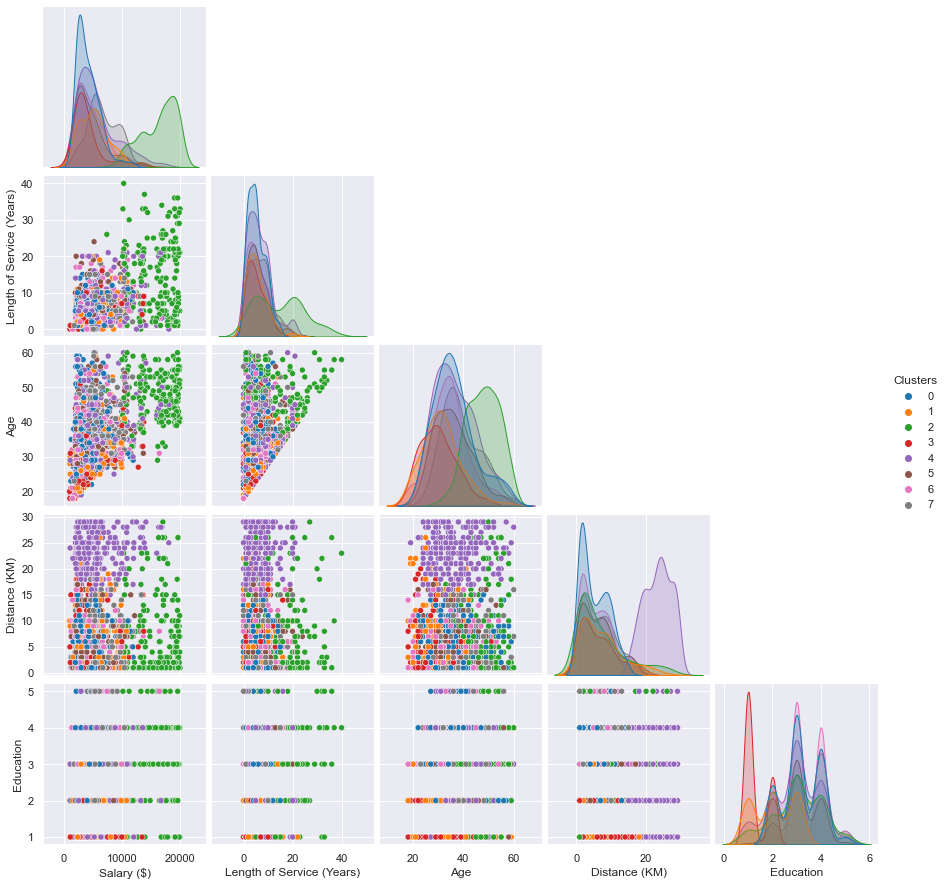

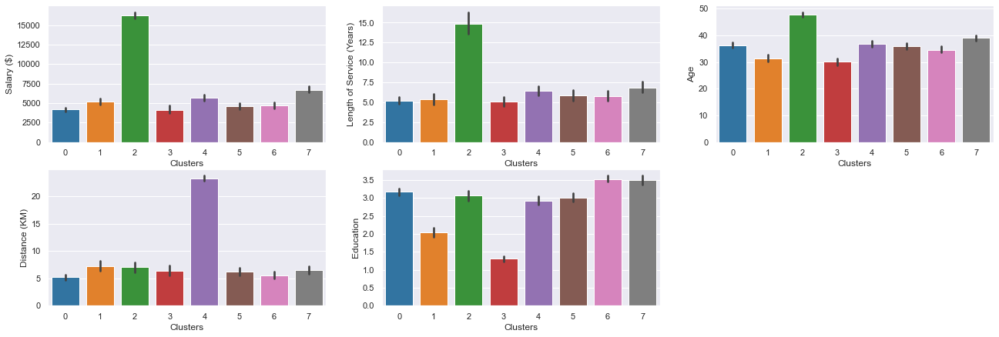

In [375]:
df_to_plot = get_cluster_info(comp_df,lbls)
bar_plot(df_to_plot)
plt.show()

# Hierarchical Clustering (Agglomerative Clustering with gower)

##### Use of default 2 clusters.

> **General Idea of Agglomerative Clustering:**
1. Agglomerative Clustering is a bottom up approach where we start off with many small clusters and merge them together to create bigger clusters. This can be useful as clustering may correspond to meaningful taxonomies. 
2. _TLDR:_ Recursively merges pair of clusters of sample data

> **How Agglomerative Clustering works:**
1. Agglomerative Clustering starts from an individual cluster group (N groups), (each data instance is considered as an individual cluster, aka leaf), 
2. Based on the gower distance matrix passed into the model, the datapoints that are most similiar to each other merges together to form clusters. At each step, the two clusters with the shortest distance with each other would merge creating what we called node (larger cluster). 
2. The process is repeated until all the data points assigned to one cluster called root.
> **Linkage Criteria**
1. There are several linkage criteria for us to choose from.
    - `Single` linkage - aka NearestNeighbors, refers to distance between two clusters being the shortest distance between two points in each cluster
    - `Complete` linkage - refers to distance between two clusters being the longest distance between two points in each cluster.
    - `Average` linkage - refers to distance between clusters being the average distance between each point in one cluster to every point in other cluster
    - `Ward` linkage - refers to distance between clusters being the sum of squared differences within all clusters

> [Source](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html) + [Source](https://towardsdatascience.com/machine-learning-algorithms-part-12-hierarchical-agglomerative-clustering-example-in-python-1e18e0075019)

> **What do we do?**
- Since we are aiming for explicability, hierarchical clustering would be useful.
- Use of default 2 clusters
- We will set `affinity= 'precomputed'`, as we are fitting a gower matrix. We cannot use the default `euclidean`
- The linkage parameter determines which distance to use between sets of observation. The algorithm will merge the pairs of cluster that minimize this criterion.
- Set `linkage = complete`, that uses the maximum distances between all observations of the two sets. This is because the default ward can only work with euclidean distances, which does not make sense in our scenario

<!-- ![Hello](https://miro.medium.com/max/1050/1*RgJZRDA5MR7SPlGSAVsCaw.png) -->



In [376]:
def agglomerative_cluster(n_clusters: int, X: Sequence):
    """
    Returns no. of cluster, labels, centroids, and labels for agglo clustering
    """
    agglo = AgglomerativeClustering(n_clusters = n_clusters, affinity= 'precomputed', linkage= 'complete')
    df = X.copy()
    df = gower_matrix(df,cat_features=[col in select_cols for col in df.columns])
    cluster_lbls = agglo.fit_predict(df)
    try:
        centroids = df.groupby(cluster_lbls).mean()
    except:
        centroids = np.nan
    return agglo.n_clusters_, cluster_lbls, centroids ,agglo

### Agglomerative Clustering results and cluster information

In [377]:
agglo_labels = cluster_visualization(X=comp_df,n_clust=2, model=agglomerative_cluster)

calinski_harabasz_score 951.3547415857556
For n_clusters = 2 The average silhouette_score is : 0.42427185


> **Observations from Agglomerative Clustering**

From the silhouette diagram and 3d scatter plot:
1. We can see that clusters are of widely differing sizes, with silhouette scores generally above average. There is a single data point in the blue cluster with negative silhouette score, where it could be wrongly clustered. 
2. Clusters are generally distinct and somewhat separated which is good as seen from scatter plot, and cluster centroids are quite far apart
2. However, we need to take a look at the characteristics of the cluster to determine if there is quality separation with meaningful clusters.
3. The silhouette score is 0.4, which is quite good, and the calinski harabasz index is also quite high of 950, suggest that clusters are dense and separated.


#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance (KM),BusinessTravel,Length of Service (Years),Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,,
0,37.718850,No,Married,3,Research & Development,8.906550,Travel_Rarely,7.498403,6890.882588,85.170068
1,32.357798,Yes,Single,3,Research & Development,10.834862,Travel_Rarely,4.192661,4274.880734,14.829932


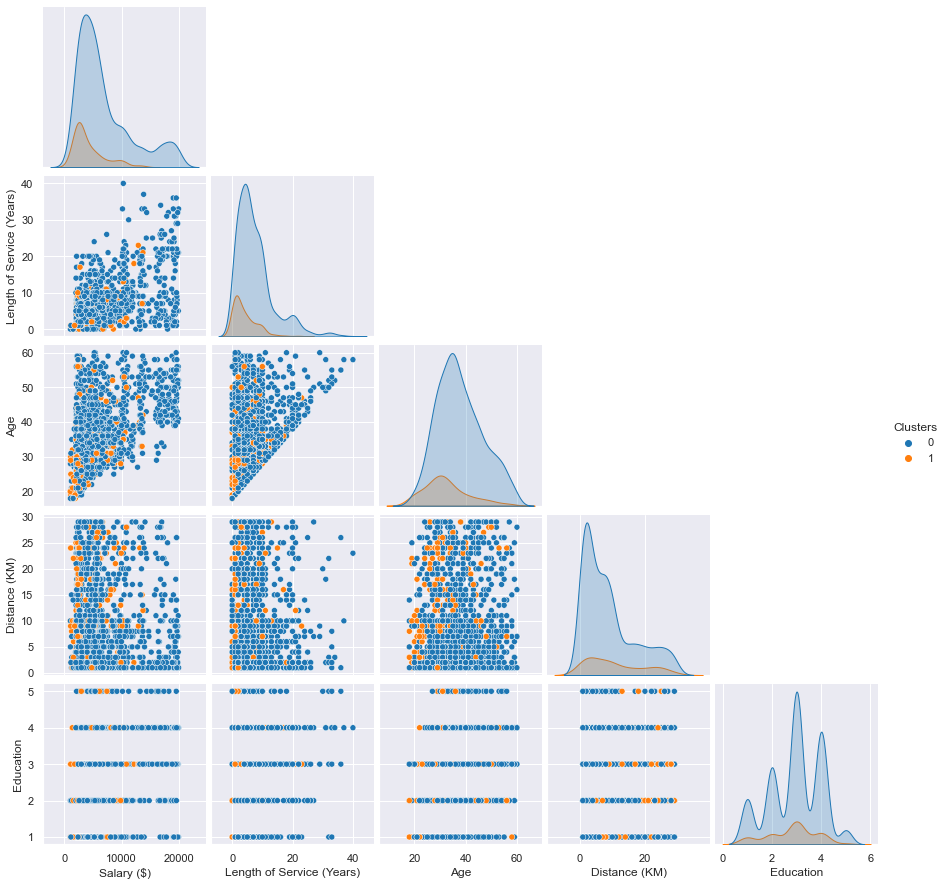

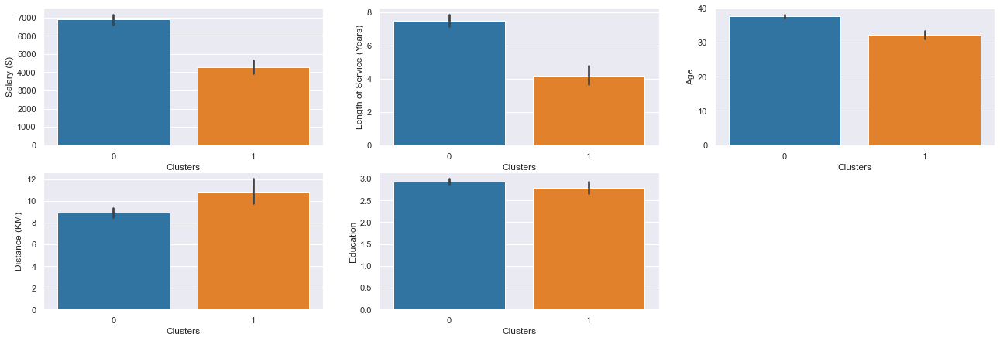

In [378]:
df_to_plot = get_cluster_info(comp_df,agglo_labels)
bar_plot(df_to_plot)
plt.show()

### **Agglomerative Clusters Analysis**
1. From the descriptive statistics and bar plot, we notice that now we can now view the characteristics of the employees that have resigned. We note that they have somewhat lesser salary and lesser length of service than those employees that have not resigned. However, there isnt enough detail of the characteristics that truly separate the 2 clusters. 
2. Hence, in other words, the clusters are not informative enough to account for the variety of employees that resign and do not resign. Specifically, the main insight we are only able to tell is the difference in salary of those employees that have resigned and have not. There is not enough distinct and meaningful information to get a grasp of what is the main understanding or reason why the employees resign
3. Hence, I will perform further improvement later by choosing number of k.


# Spectral Clustering

**Use Default 6 clusters**

1. Spectral Clustering is based on the technique of _Connectivity_.
1. Spectral clustering is a technique with roots in graph theory, where the approach is used to identify communities of nodes in a graph based on the edges connecting them.
2. Spectral clustering uses information from the eigenvalues (spectrum) of special matrices built from the graph or the data set.
4. It makes use of eigenvalues of the similarity matrix of data, with each element measuring the similarity between data points, to perform dimensionality reduction, followed by clustering in lower dimensions. 
3. An important point to note is that no assumption is made about the shape/form of the clusters, rather than relying on a centroid approach.
> **Process steps of Spectral clustering**
1. Computation of a similarity graph
2. Project the data onto a low-dimensional space.
3. Then compute clusters.
> **SKLEARN Spectral Clustering**
1. We will set affinity = 'precomputed' and also use default 8 clusters. 
2. Set `assign_labels='discretize'` as discretization is an approach which is less sensitive to random initialization.

In [99]:
def spectral_cluster(n_clusters: int, X: Sequence) -> Tuple[int, Sequence, Sequence, sklearn.cluster.SpectralClustering]:
    """
    Returns labels for spectral clustering
    """
    spectral = SpectralClustering(n_clusters=n_clusters,random_state=rstate,n_jobs=-1,verbose=2, assign_labels='discretize', affinity='precomputed')
    df = X.copy()
    gower_mat = gower_matrix(df,cat_features=[col in select_cols for col in df.columns])
    cluster_lbls = spectral.fit_predict(gower_mat)
    # Groupby for cluster centroids
    return None, cluster_lbls, df.groupby(cluster_lbls).mean() ,spectral


**Pros and Cons of spectral clustering**
1. Does not make assumptions on the cluster. Unlike KMeans, which assumes that the points assigned to a cluster are spherical about the cluster center. Hence spectral clustering may produce more accurate clusters.
2. Cons are computationally expensive for large dataset

> [Source](https://towardsdatascience.com/spectral-clustering-82d3cff3d3b7)

> **Observations from Spectral Clustering**

From the silhouette diagram and 3d scatter plot:
1. We can see that clusters are of similar sizes, with silhouette scores generally not very good. 
2. From the 3d scatter plot, the clusters points are at random and overlapping, and there is no clear segregation. This suggests that clusters produced by spectral clustering are not ideal and of high quality. Furthermore, the cluster centroids are overlapping, which would mean that characteristics among the clusters would not allow for meaningful comparison.
3. The silhouette score is close to 0 which means that distance between clusters are not significant at all, and the calinski harabasz index is also very low of an underwhelming 13, suggest that clusters random and not separated.
4. Spectral Clustering is not able to provide us with meaningful employee segmentation.


In [100]:
spectral_lbls = cluster_visualization(comp_df,n_clust=8,model=spectral_cluster)

Computing label assignment using discretize
calinski_harabasz_score 13.44972078582925
For n_clusters = 8 The average silhouette_score is : 0.03665222


#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance (KM),Length of Service (Years),Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,
0,36.143617,No,Married,3,Research & Development,9.340426,6.898936,6376.031915,12.789116
1,36.555556,No,Married,3,Research & Development,9.315789,6.543860,6227.947368,11.632653
2,37.378238,No,Married,3,Research & Development,9.424870,7.533679,6673.844560,13.129252
3,36.750000,No,Married,3,Research & Development,9.586957,7.271739,6497.875000,12.517007
4,37.274038,No,Married,3,Research & Development,8.572115,7.490385,6707.812500,14.149660
5,37.473404,No,Married,3,Research & Development,8.303191,6.819149,6718.500000,12.789116
6,37.125000,No,Married,3,Research & Development,9.897727,6.840909,6628.659091,11.972789
7,36.567901,No,Married,3,Research & Development,9.228395,6.481481,6092.765432,11.020408


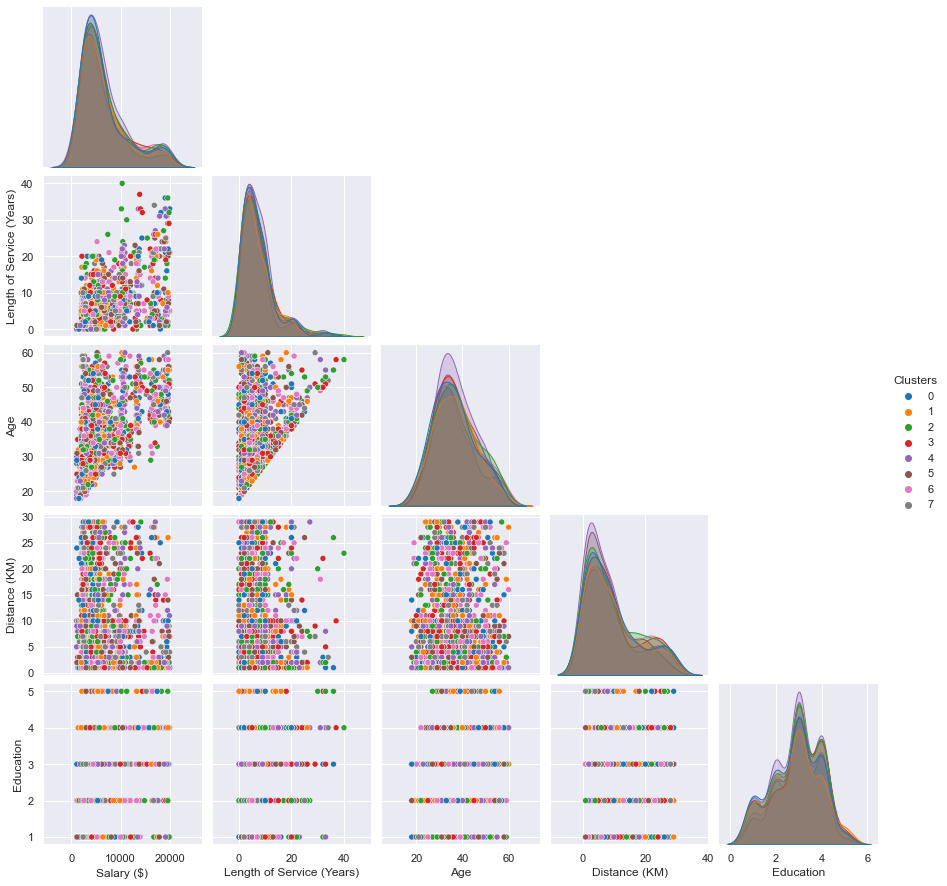

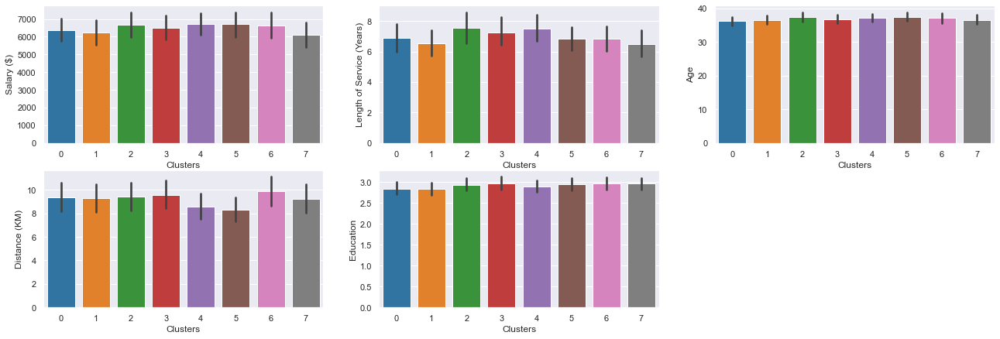

In [107]:
plot_n=get_cluster_info(comp_df,spectral_lbls)
bar_plot(plot_n)
plt.show()

### **Spectral Clusters Analysis**
1. From the descriptive statistics and bar plot, we do not see any significant difference between clusters. We note that the characteristics of each cluster are generally very similar, with no noticable insights.
2. We are unable to tell which employee group is vulnerable to resignation as the cluster labels seems to be assigned at random
3. Hence it is hard to truly devise meaningful strategies to satisfy and retain employees.

>**PairPlot**
1. From the pairplot, there is no significance difference in the distribution of each cluster.
2. Overlapping points 

# Model Improvement





### Shortlisted models
1. We will try to improve on K prototypes as it provides us with a variation of characteristics, and have yet to maximize its potential
2. Similarly, we have not thoroughly utilized the power of agglomerative clustering
3. As for spectral clustering, I will not be using as it does not seem to provide us with meaningful and distinct clusters. Furthermore, the clusters seems like it is assigned at random

- As part of the model improvement process, I will attempt to explore improvement methods for different models so that we can improve the quality of clustering.
- For example, models that require us to specify number of clusters, we can plot an elbow plot.

## Hierarchical Clustering
1. We need to opt for model improvement for agglomerative clustering. This is because using the default parameters does not give us any informative and rich clusters. Moreover, from the descriptive statistics, there is no significant difference between the clusters, at most it only distinguishes between employees with slightly higher salary and employees with lower salary. 
2. Hence, it would be hard for us to brainstorm any retention strategies for employees as there is not enough details. Hence we need to search for better clusters. 
> **Dendrogram**
1. To search for more quality clusters, we will plot a dendrogram, which plots the distances/dissimilarity between clusters in the vertical axis. The dendrogram is a result of the linking of points in a dataset. We are able to bette visualize the hierarchical clustering or merging process.
2. With a dendrogram, we can select the number of clusters by drawing a line to cut the dendrogram when the clusters formed start becoming too similar. We can use a dendrogram to visualize the history of groupings and figure out the optimal number of clusters.
3. Finding a good number of clusters is the same as finding the largest verical distance space that does not have any horizontal lines (which is the separation of clusters). This means that there's more separation between the clusters.
>**Process**

    - Determine the largest vertical distance that doesn’t intersect any of the other clusters
    - Draw a horizontal line at both extremities
    - The optimal number of clusters is equal to the number of vertical lines going through the horizontal line
>**In our case, we make the horizontal cut at y = 0.81, and since 3 vertical lines intersect the horizontal line, we will attempt to test out 3 clusters**, after that the clusters become less well defined

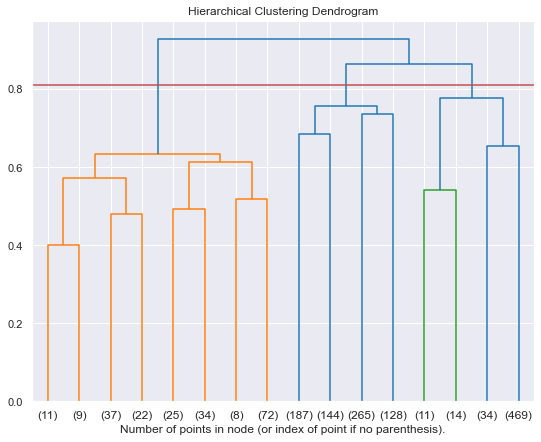

In [379]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

    
gower_mat = gower_matrix(comp_df,cat_features=[col in select_cols for col in comp_df.columns])
agg_cluster = AgglomerativeClustering(distance_threshold=0, n_clusters=None,affinity= 'precomputed', linkage= 'complete').fit(gower_mat)

plt.figure(figsize = (9,7))
plt.title('Hierarchical Clustering Dendrogram')
plot_dendrogram(agg_cluster, truncate_mode='level',p=3)
plt.hlines(0.81, 0, 300, colors = 'r') 
# Plotting the clutering line with optimal seperation
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

#### Silhouette analysis when k = 3
1. When K = 3, we note that the orange cluster is somewhat below average given that it is below the average silhouette score. Negative silhouette score for some data points is observed from the orange and blue cluster
2. Furthermore, there is a uneven size of clusters, with the dark blue cluster being the smallest size.
3. From the scatter plot, the yellow and dark blue clusters seems to be largely overlapping, however, there seems to be some separation among the pink cluster.

In [380]:
dendro_label = cluster_visualization(comp_df,n_clust =3, model=agglomerative_cluster)

calinski_harabasz_score 555.3369252047269
For n_clusters = 3 The average silhouette_score is : 0.33198765


### Descriptive stats
1. from the descriptive statistics, we can also understand employees that resign better.
2. However, one big drawback is that there is no variation of characteristics among clusters.
3. For example, the only attribute that distinguishes each cluster is 'Resign status' and salary of the employee group, nothing else, hence in other words, we are only using 2 attributes to differentiate employees. This is not very ideal.
4. From the pair plot, the points of clusters appear at random

#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance (KM),BusinessTravel,Length of Service (Years),Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,,
0,37.106061,No,Married,3,Research & Development,10.020833,Travel_Rarely,6.592803,5587.509470,35.918367
1,32.357798,Yes,Single,3,Research & Development,10.834862,Travel_Rarely,4.192661,4274.880734,14.829932
2,38.165746,No,Single,3,Research & Development,8.093923,Travel_Rarely,8.158840,7841.408840,49.251701


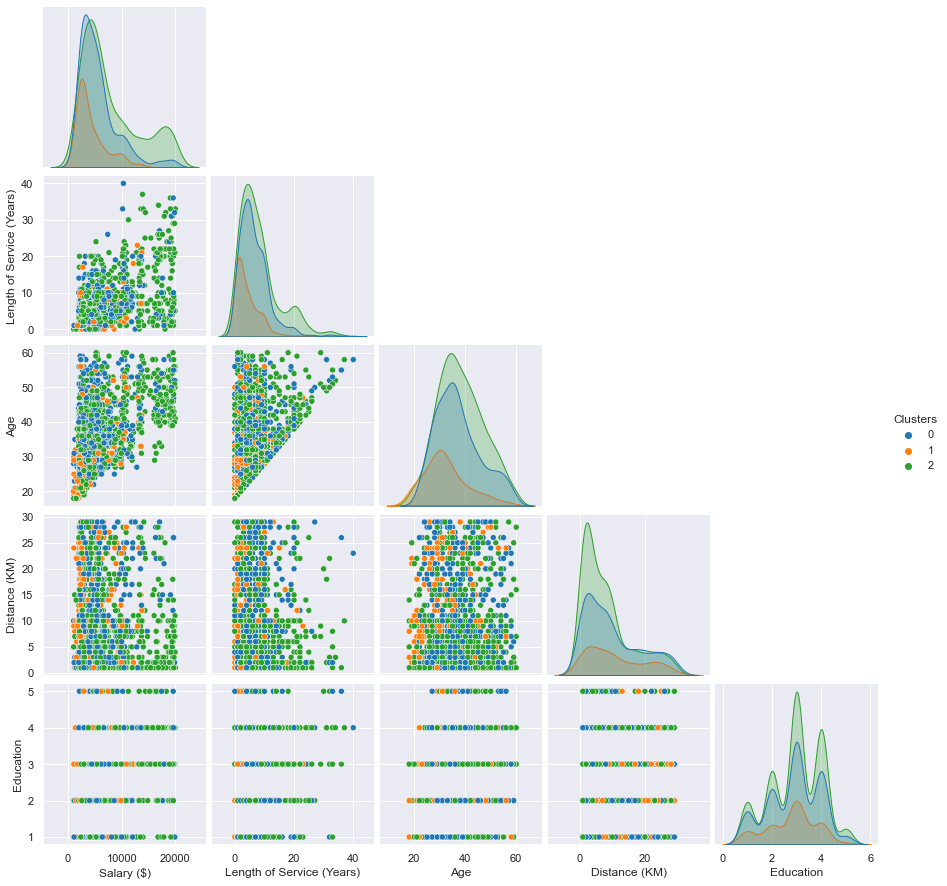

In [381]:
dendro_bar = get_cluster_info(comp_df,dendro_label)

# K Prototypes

### Select optimal no. of clusters for K-Prototypes
1. Initially, we found out that the default number of clusters, (`n_clusters = 8`) did not provide quality or meaningful clusters. Some problems include the cluster size being too small, given that the thickness of silhoette plot is inconsistent among the clusters. There are some clusters with thick, while other clusters are quite large. Furthermore, from the scatter plot we noted that there were significant overlapping clusters. However our dataset is quite huge in terms of rows, hence this may be a issue for most models.
2. We also noted that some silhouette coefficients were negative, hence instances may be wrongly assigned, hence clusters may not be well defined.
3. Given these issues, our clusters may not be very distinct, as such interpretability and explicability may be an issue.


### K-Prototypes Elbow plot
1. We will first plot an elbow plot to find the optimal number of clusters. The elbow plot is the clustering cost (which is defined as the sum of distance from each instance to its centroid), as a function of the number of clusters
2. We need to record the clustering cost of K-prototypes clustering, as the number of clusters increase. As mentioned, the lower the cost, the more tightly packed the cluster is. However, the clustering cost obviously would decrease with an increase of clusters. Hence, we want to find the point where the elbow plot flattens (shows elbow shape). This is where the decrease in clustering cost slows down (stops dropping fast), which would mean that the optimal number cluster would be around that area, and increasing more would not provide significant improvements
3. To plot the elbow plot, we will first perform normalization on numerical features, then instead of calculating the within sum of squared errors (WSSE), k prototypes provides cost function that combines calculation for numerical & categorical variables. We record the clustering cost via the `.cost_` attribute. 

In [275]:
elbow_df = comp_df.copy()
costs = []
n_clusters = []
for i in tqdm(range(2, 10)):
    try:
        elbow_df = custom_scaling(elbow_df,int_cols=int_cols)
        kproto = KPrototypes(n_clusters=i, init='Cao',random_state=rstate, max_iter=500)
        kproto.fit_predict(elbow_df, categorical=cat_cols)
        costs.append(kproto.cost_)
        n_clusters.append(i)
    except:
        print(f"Can't cluster with {i} clusters")
fig = go.Figure(data=go.Scatter(x=n_clusters, y=costs, ))
fig.update_layout(    scene = dict(xaxis_title='No. of clusters',
                    yaxis_title='Cost' ),
    title="Elbow Plot",
    font=dict(
        size=12,
        color="RebeccaPurple"
    ))
fig.update_xaxes(title_text = "No. Clusters").update_yaxes(title_text = "Clustering Cost")
fig.show()
# notice where it flattens

100%|██████████| 8/8 [02:00<00:00, 15.08s/it]


**Observations**
1. From the elbow plot, we can see that the optimal clusters appear to be around 4 to 5 or 6. However, there is no specific number clearly shown as the elbow shape is not very clear.
2. We will explore the quality of clusters when k =4,5,6. We will then make a decision

In [ ]:
for counter in range(4,7):
    elbow_kpro = cluster_visualization(comp_df,counter,k_prototypes,metric = 'precomputed')
    _=get_cluster_info(comp_df,elbow_kpro, pair=False)

>**K = 4**
- When K = 4, calinski_harabasz_score = 185.11892424366366. Clustering cost is moderately high of 448. From the descriptive statistics, we are still unable to understand the characteristics of employee group that have resigned. hence, it is hard to devise strategies to satisfy and retain employees. 
- The orange cluster also has below average silhouette score, which is not very ideal. 
- From the scatter plot, we can see that some clusters are 'mixing' and overlapping in the middle. However, we can see that on the left, there is a distinct cluster.
- Cluster 0 earns the most salary while the other clusters earn around 4-6k. Generally, we can only compare employee groups that earn more vs earn less. And employees that live far away from company as opposed to those who live nearer, and those who are older or younger
- Lack of meaningful clusters and characteristics variation to truly understand the employee groups
> **K=5**
1. For k =5, we are able to derive the same set of cluster characteristics as of k =4. Uneven cluster size is also observed as seen from thickness of silhouette plot. However, orange cluster in the corner of the scatter plot seems pretty well defined Likewise, we are not able to understand employee groups that have resign. 
> **K = 6**
1. From scatter plot and silhouette diagram, the red cluster is below average and poorly defined and of low quality, with almost half the data points having negative silhouette score. Apart from red clusters, the other clusters are pretty well defined.
The low calinski harabasz index shows that clusters are not very separated. Although there are some variation among the clusters, there is still insufficient information that helps us understand the employee group that resigns. 
2. At least 3 clusters are mixing with each other in the middle right

>**Overall**
1. Overall, K =6 gives the best variation in characteristics, while k =4 has a decent silhouette score of 0.24

- To further reduce the ambiguity of clustering, I will perform unsupervised feature selection for k prototypes to select the more relevant features.

# Unsupervised Feature Selection for K-Prototypes

1. Apart from ANOVA just now, I will attempt to perform unsupervised feature selection for k prototypes to see if we can further improve on the quality of the clusters.
1. We hope to select relevant features that produce quality and distinct clusters so that our cluster interpretation would be accurate and meaningful. With unsupervised feature selection, clustering would be performed on different subset of features. Our goal is to minimize the cost of clustering, which is defined as the sum distance of all points to their respective cluster centroids, and also reduce the ambiguity of clustering.
2. I will be plotting an elbow plot with all the combinations of features.
2. Since, we start off at 9 features, I will be trying out the different combination subsets 8 features using `combinations` from itertools library.
> **Why 8 features for clustering?**
1. We may face the problem of information loss of the clusters if we try to reduce subset of features further. As a result, our clusters may have a lack of information. In such a scenario, it would be difficult to devise retention strategies to target the most vulnerable group of employees.

In [115]:
def select_best_feature(n_clusters,X:Sequence):
    """
    Function to perform k prototypes clustering, and returning the cost
    """
    df = X.copy()
    # Define categorical var
    cat_name=df.select_dtypes(exclude = 'int').columns

    cat_cols = [df.columns.get_loc(c) for c in cat_name]

    # Perform minmax scaling
    df = custom_scaling(df, int_cols=df.select_dtypes(include = 'int').columns)
    
    k_pro = KPrototypes(n_clusters=n_clusters,max_iter=1000, random_state=rstate, n_jobs=-1, init='Cao')
    k_pro.fit(df, categorical=cat_cols)
    lbls = k_pro.predict(df, categorical=cat_cols)
    # Compute silhouette score
    input_df = gower_matrix(df,cat_features=[col in select_cols for col in df.columns ] )
    silhouette = silhouette_score(input_df, lbls, metric='precomputed')
    return lbls,k_pro.cost_, silhouette

- I will be appending the cost, number of clusters and the feature set to a list

In [151]:
# features_sets = chain(combinations(comp_df.columns,7), combinations(comp_df.columns,8))
features_sets = chain(combinations(comp_df.columns,8))
logs = []
sil_log= []
for features in tqdm(features_sets):
    for n_cluster in range(2,10):
        labels, cost, silhouette= select_best_feature(n_cluster, comp_df[list(features)])
        logs.append([features, n_cluster, cost])
        sil_log.append([features, n_cluster,silhouette])


9it [09:33, 63.76s/it] 


### Elbow plot for the different combinations of features.
1. I will be using plotly so we can easily hover over the lines to see the feature subset that provides quality clustering
5. To visualize and pick number of clusters better, I will also use the approach of plotting the silhouette score as a function of the number of clusters. There will often be a peak, and the optimal number of clusters is nearby.
2. It seems that the optimal clusters is around 5 or 6 for all subset of features, similar to the elbow plot we plotted just now.
3. By hovering the line that provides the best silhouette score and lowest clustering cost, we can see the most optimal feature subset is the one below.
![title](dataset/unknown.png)
3. It seems that distance (KM) has been removed, hence we can likely say that removing distance KM would reduce the ambiguity of clustering as it does not provide new information that could help employee segmentation.
4. We will deep dive further for k = 5 and 6 for this new feature subset



In [152]:
records_df = pd.DataFrame(logs, columns=['Features', 'n_cluster', 'Cost']).set_index("Features") 
cost_df = records_df.pivot_table(values = 'Cost', index='n_cluster', columns='Features')
fig = px.line(x=records_df['n_cluster'], y=records_df['Cost'] , color=records_df.index,
              line_group=records_df.index,
              labels=dict(x="No. Clusters", y="Clustering Cost"),width=1400, height=400)
fig.update_layout(
    title="Elbow Plot of the different combinations of features",
    font=dict(
        size=12,
        color="RebeccaPurple"
    ))
fig.show()

In [340]:
sil_df = pd.DataFrame(sil_log, columns=['Features', 'n_cluster', 'Silhouette Score']).set_index("Features") 
sil_records = sil_df.pivot_table(values = 'Silhouette Score', index='n_cluster', columns='Features')
fig2 = px.line(x=sil_df['n_cluster'], y=sil_df['Silhouette Score'] , color=sil_df.index,
              line_group=sil_df.index,
              labels=dict(x="No. Clusters", y="Clustering Silhouette Score"),width=1400, height=400)
fig2.update_layout(
    title="Line plot of the different combinations of features",
    font=dict(
        size=12,
        color="RebeccaPurple"
    ))
fig2.show()

#### Exploring the best feature subset

In [389]:
def updated_info(df, lbls, int_cols = int_cols):
    eval_df = df.copy(deep=True)
    integer_cols = int_cols.copy()
    eval_df['Clusters'] = lbls
    cluster_info= eval_df.groupby('Clusters').agg(
            {
                'Age':'mean',
                'Resign Status': lambda x: x.value_counts(sort=True).index[0],
                'MaritalStatus': lambda x: x.value_counts(sort=True).index[0],
                'Education': lambda x: x.value_counts(sort=True).index[0],
                'Job Function': lambda x: x.value_counts(sort=True).index[0],
                'Length of Service (Years)': 'mean',
                'BusinessTravel': lambda x: x.value_counts(sort=True).index[0],
                'Salary ($)': 'mean',
            }
        ).reset_index()
    cluster_info['Cluster Size (% of Total)'] = pd.Series(eval_df['Clusters']).value_counts() / len(eval_df['Clusters']) * 100
    cluster_info.set_index('Clusters', inplace=True)
    display(Markdown('#### **Cluster Info**'))
    display(cluster_info)
    sns.pairplot(eval_df[integer_cols + ['Clusters']], hue='Clusters', corner=True, palette="tab10")
    plt.show()
    return eval_df   

In [353]:
def best_k_prototypes(n_clusters,X:Sequence, init='Cao', integer_cols = int_cols, select_cols= select_cols):
    df = X.copy()
    # Define categorical and int variables
    # cat_name=select_cols
    cat_cols = [df.columns.get_loc(c) for c in select_cols]

    # Perform minmax scaling
    df = custom_scaling(df, int_cols=integer_cols)
    
    k_pro = KPrototypes(n_clusters=n_clusters,max_iter=1000, random_state=25, init=init, n_jobs=-1)
    k_pro.fit(df, categorical=cat_cols)
    lbls = k_pro.predict(df, categorical=cat_cols)
    return None, lbls,k_pro.cluster_centroids_, k_pro

#### K = 5 for new subset of features (without distance KM)

In [354]:
combi_df = comp_df.copy()
combi_df.drop(columns=['Distance (KM)'], inplace=True)
combi_5 = cluster_visualization(combi_df,n_clust=5, model=best_k_prototypes, model_params=dict(integer_cols = ['Salary ($)',
 'Length of Service (Years)','Education','Age'] ))

calinski_harabasz_score 215.15381413926607
For n_clusters = 5 The average silhouette_score is : 0.27298462
Clustering cost: sum distance of all points to respective cluster centroids 327.36148776663805


#### Descriptive stats for k = 5, without DISTANCE (KM)
1. We immediately notice that when k =5, without distance KM, most of the clusters are of even size, with most clusters being well defined, given that they are above average. Silhouette score is 0.27, which is a good improvement from the original subset of features.
2. From the scatter plot, we note that the clusters are more separated now.
3. However, from descriptive statistics, we are still not able to find the group of employee that is the most vulnerable to resignation hence k =5 does not help us fulfill our objectives, hence we will try k = 6
4. On the other hand, the pair plot shows clear cluster separation, which is a good thing.

#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Length of Service (Years),BusinessTravel,Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,
0,32.584775,No,Married,1,Research & Development,5.411765,Travel_Rarely,4551.498270,19.659864
1,47.420561,No,Married,3,Research & Development,14.060748,Travel_Rarely,15892.981308,14.557823
2,40.619247,No,Divorced,3,Sales,7.761506,Travel_Rarely,7140.297071,16.258503
3,35.843666,No,Married,4,Research & Development,5.277628,Travel_Rarely,4400.867925,25.238095
4,32.792717,No,Single,3,Research & Development,5.366947,Travel_Rarely,4211.694678,24.285714


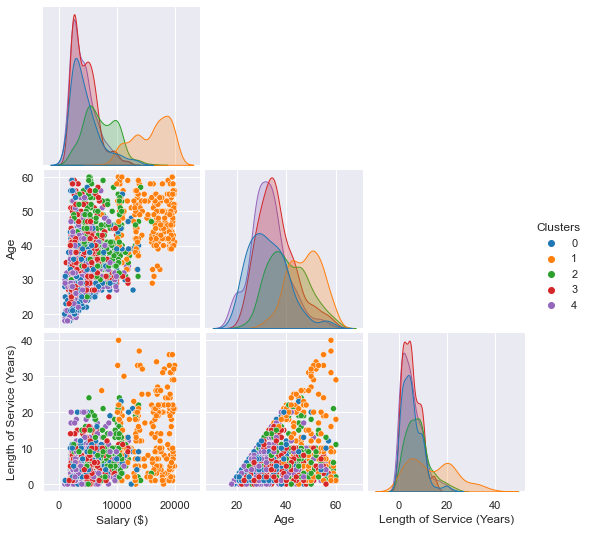

In [355]:
_ = updated_info(combi_df,combi_5,int_cols = ['Salary ($)', 'Age', 'Length of Service (Years)'])

> ### K = 6 for new subset of features (without distance KM)

1. From the silhouette diagram we note that each cluster have some data points that have negative silhouette score, suggest that instances may be assigned the wrong way
2. For k =6 and with the distance KM removed, we obtained a silhouette score of 0.29, higher than the silhouette score when k =5 which is a very good sign. Furthermore, the clustering cost is also pretty low.
3. All of clusters are of above average, given that they are beyond the average red line, with the purple cluster being the most well defined
4. From the scatter plot, we note that the clusters are no longer overlapping in the middle, and there is significant separation between most clusters now.
5. Overall, this is a huge improvement from our original feature set, and is significantly better than k =5, since it has higher silhouette score.

> **From descriptive stats:**
1. From descriptive statistics, we can finally understand the employee groups that have resigned, hence we are now able to further analyze and derive strategies to satisfy and retain employees
2. We also note a great deal of variation of characateristics among clusters, this suggests that the clusters are distinct and little occurance of overlapping information.
3. In other words, the clusters are very informative, and is able to account for the variety of employees that resign and do not resign. There is a presence of distinct and meaningful information for us to compare
3. Overall, k prototypes with 6 clusters and without distance KM provides us with significant and quality/well defined non overlapping clusters. Furthermore, it possess the higher silhouette score than k =5. Hence, this will be our final model

In [390]:
combi_df = comp_df.copy()
combi_df.drop(columns=['Distance (KM)'], inplace=True)
combi_6 = cluster_visualization(combi_df,n_clust=6, model=best_k_prototypes, model_params=dict(integer_cols = ['Salary ($)',
 'Length of Service (Years)','Education','Age'] ))

calinski_harabasz_score 197.3356234302612
For n_clusters = 6 The average silhouette_score is : 0.28416356
Clustering cost: sum distance of all points to respective cluster centroids 308.30631821694806


#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Length of Service (Years),BusinessTravel,Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,
0,36.230769,No,Married,4,Research & Development,5.344729,Travel_Rarely,4444.242165,23.877551
1,37.557377,No,Single,3,Sales,8.192623,Travel_Rarely,7283.459016,16.598639
2,27.455090,Yes,Single,3,Research & Development,3.269461,Travel_Rarely,2945.083832,11.360544
3,47.961722,No,Married,3,Research & Development,14.066986,Travel_Rarely,15925.210526,14.217687
4,33.946360,No,Married,1,Research & Development,6.095785,Travel_Rarely,4903.291188,17.755102
5,37.512605,No,Divorced,3,Research & Development,5.672269,Travel_Rarely,4715.373950,16.190476


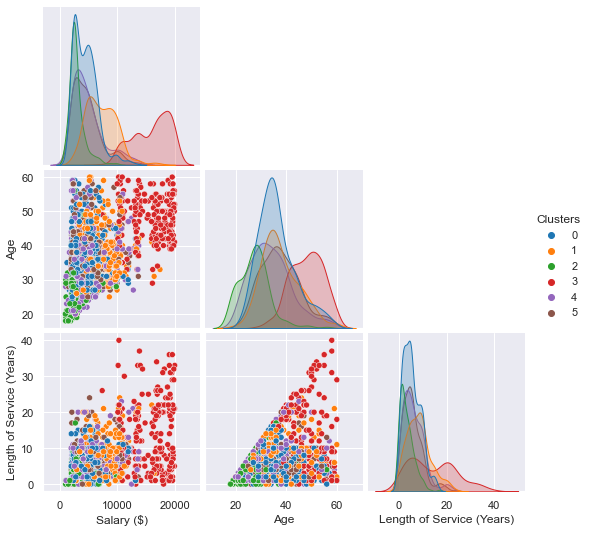

In [391]:
_ = updated_info(combi_df,combi_6,int_cols = ['Salary ($)', 'Age', 'Length of Service (Years)'])

# Final model

We will be selecting our final model to be K-Prototypes with 6 clusters, with features including ['Age	Resign Status	MaritalStatus	Education	Job Function	Length of Service (Years)	Salary ($)  BusinessTravel']

I chose K-Prototypes over Agglomerative Clustering because although Aggloremative Clustering returned a good of silhouette score of 0.3, there isnt enough distinct information among the employee clusters, suggesting that it will be difficult for us to devise customised and personalized strategies to satisfy and retain employee vulnerable to resignation. our final model K prototypes finally has a silhouette score of 0.28

# Final cluster analysis

>**Average Corporate employee Pam (Cluster 0)**
- This cluster group seems to represent married middle aged employees, working for an average of 5 years in the company. Hence, they have a fair bit of experience in the organization. Considering their average age of 36, it is not likely to be their first job. Furthermore, given the fact that this employee group have very high education qualifications level of 4, it greatly supplements the skills needed for job function like Research and Development, where they would develop new services or products. Most of the employees of this group are not resigned, suggesting that this group is not the group of employees that are most vulnerable to resignation. Furthermore, most employees in this group earn on average about 4.4k, this is somewhat lower than the other employee clusters that have lower education levels
> **Committed Salesperson Jim (cluster 1)**
- This cluster seems to represent single middle-aged employee group that are working under sales, responsible for interacting with customers and potential clients, presenting the company products or services, and closing deals, they usually work a commission-based salary, and they earn money based on how well they perform. Generally, although education level is important, the way how the employee group present and sell themselves is more crucial for success in a sales role. Given that they have significance in working experience with the company, on an average service length of 8 years, they are likely to have rich experiences in securing sale deals, which can explain higher salary of 7.2k \$. Given how that most employees in this cluster are still with the company, it is not the most vulnerable group of employee prone to resignation
> **Job Hopper Tim (Cluster 2)**
- This employee group seems to represent young employees who are single. They are likely fresh graduates given the prime age of 27, and education level of 3. Given that they only spend an average of 3 years with the company, they are likely still fresh, discovering their ideal job role and interests before finally keeping into one job role. Hence, they are also likely to job hop, in search of a higher pay to support themselves. With this, they might want to achieve a more robust financial state. Overall, employees of this group earn around 2.9k on average, significantly lower than other employee clusters. This is the most vulnerable group of employee prone to resignation as most employees in this cluster has left the company.
> **Loyal and Family Guy Lester (Cluster 3)**
- This cluster seems to represent older employees of over 40 years of age, who are married, and likely to have a well established family to support (financial commitments). Although their education level is still a 3, what truly separates them from other employees is the very long service length in the company of average 14 years in the Research and development function. With this, they are likely to have valuable work experiences which allows them to contribute significantly to the company, which can explain the high average salary of 16k, along with possible high status. Given how that most employees in this cluster are still with the company, it is not the most vulnerable group of employee prone to resignation
> **Talented Beluga (cluster 4)**
- This cluster seems to describe employees that are married and are middle aged. Despite having low educational qualifications of level 1, they are able to contribute in the R and D function with their talents and industry skillsets. They have been with the company for an average service length of 6 years. Since they are at a ripe age of 33, given more time, they would continue to pick up skillsets and knowledge to further contribute towards the company. Given how that most employees in this cluster are still with the company, it is not the most vulnerable group of employee prone to resignation.
> **Sad Corporate Ladder Hur (Cluster 5)**
- This cluster seems to represent middle aged employees that have no success in their marriage life. They are motivated and are determined to advance on the corporate ladder. Given their 6 years of experience in the company, and an average of 4.7k salary, they still have more room for advancements in their career, provided they have the right attitude and work ethics. Given how that most employees in this cluster are still with the company, it is not the most vulnerable group of employee prone to resignation.


#### **Cluster Info**

,Age,Resign Status,MaritalStatus,Education,Job Function,Length of Service (Years),BusinessTravel,Salary ($),Cluster Size (% of Total)
Clusters,,,,,,,,,
0,36.230769,No,Married,4,Research & Development,5.344729,Travel_Rarely,4444.242165,23.877551
1,37.557377,No,Single,3,Sales,8.192623,Travel_Rarely,7283.459016,16.598639
2,27.455090,Yes,Single,3,Research & Development,3.269461,Travel_Rarely,2945.083832,11.360544
3,47.961722,No,Married,3,Research & Development,14.066986,Travel_Rarely,15925.210526,14.217687
4,33.946360,No,Married,1,Research & Development,6.095785,Travel_Rarely,4903.291188,17.755102
5,37.512605,No,Divorced,3,Research & Development,5.672269,Travel_Rarely,4715.373950,16.190476


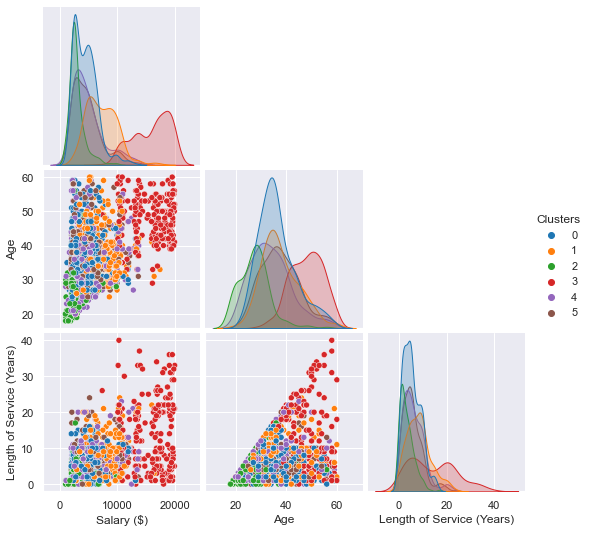

In [358]:
_ = updated_info(combi_df,combi_6,int_cols = ['Salary ($)', 'Age', 'Length of Service (Years)'])

### Recommendations
1. We will draft out recommendations and strategies to retain and satisfy the group of employees most vulnerable to resignation
2. Most vulnerable group of employees is the employees from the seocnd cluster:

| Age | Resign Status | Service (yrs) | Job Function | Marital Status | Salary | BusinessTravel|Education
| ---    | ---   | ---   | ---  | ---  | ---  |---|---|
| 27.455090   | Yes   | 3.269461   | Research & Development   | Single   | 2945   | Travel_rarely|3
> As a HR manager we can suggest some recomendations
1. Since the most vulnerable employee cluster prone to resignation are likely to be fresh graduates and may not know their ideal job scope or function related to their studies. Hence, the company can implement a job rotation flexibility where employees get to learn what other employees from other job functions (related to study) get to do on a daily basis. This would be offered to employees of below age 30 and have been around for 3 years in the company. Such can help the employees to explore different roles and task, and better suit their needs and intersts. With such a flexibility, the employee would be more satisfied and certain of the task or role they want to work in related to their studies. This can encourage employee loyalty and reduce attrition rates.
3. We can also assure the employees of career progression in the company and the chances of job promotion once performance or results they produce are good. With this, the employees would be more motivated and would feel that their efforts are properly appreciated and valued. This will increase employee loyalty
4. Company can also introduce a mentorship programme, where employees are paired with a mentor, where the mentors can offer guidance and tips. This is a win win situation as we note that the employee who tend to resign are usually fresh grads, hence with proper guidance and supervision, the fresh grad employees would feel a sense of belonging and would not feel left out, simultaneously increasing cohesion among the company. This can reduce attrition rates.
5. Offer a competitive compensation. it is essential for the company to pay employees competitive compensation, which means employers need to evaluate and adjust salaries regularly. We can see that this employee cluster that is vulnerable to resignation has significantly less salary than those who do not resign. With adjusted salaries, employees can look forward to better financial security, and do not have to worry about bringing food onto the table. By optimizing renumeration rates, it would increase retention rates. This would especially be important in view of high inflation rates currently. The company can also look into giving enticing healthcare packages and benefits.


# Conclusion:
1. In conclusion, we managed to test out different algorithms. I have personally gained more insights on mixed data, through using gower distances, specialised models such as K prototypes. We have also managed to provide recommendations and identify the most vulnerable group of employee prone to resignation
2. I hope to further hone my skills in the realm of clustering and explore more on clustering

References:
1. https://www.americanprogress.org/wp-content/uploads/2012/11/CostofTurnover.pdf
2. https://www.researchgate.net/publication/352390912_Employee_Turnover_Causes_Importance_and_Retention_Strategies
3. https://gethppy.com/employee-turnover/numbers-fall-4-negative-effects-employee-turnover

4. https://stats.mom.gov.sg/Pages/Labour-Turnover-Summary-Table.aspx
5. https://www.jstor.org/stable/25146163
1. https://www.performancemagazine.org/consequences-employee-turnover/
7. https://www.talentlyft.com/en/resources/what-is-turnover-costs#:~:text=Turnover%20costs%20definition-,Turnover%20cost%20refers%20to%20expenses%20both%20tangible%20or%20intangible%20associated,%E2%80%A2%20COBRA%20benefits%20continuation%20costs
8. Z. Huang. Extensions to the k-Means Algorithm for Clustering
Large Data Sets with Categorical Values (1998). Data Mining and Knowledge Discovery. 2(3): 283–304.

